# Evaluation of Figure 2

In this notebook, the data for Figure 2 is prepared. Note, that due to known issues in the umap-learn package, the plots are not 100% reproducable over all machines. However the overall structure will be preserved.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sb
import scanpy as sc
import scirpy as ir
import anndata
import gseapy
import scipy

from matplotlib import rcParams
import matplotlib.pyplot as plt

C:\Users\felix.drost\Anaconda3\envs\mvTCR_repro\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import sys
sys.path.append('../mvTCR')
import tcr_embedding.utils_training as utils
import config.constants_10x as const

In [3]:
sb.set_style("whitegrid")

In [4]:
def load_model(adata, model, weight=1):
    path_model = f'saved_models/journal/Haniffa/haniffa_tcr_{model}_{weight}.pt'
    model = utils.load_model(adata, path_model)
    return model
    

In [5]:
def load_data():
    adata = utils.load_data('Haniffa')
    return adata

In [6]:
path_out = '../results/fig2_haniffa_lv.h5ad'

## Loading

In [7]:
data = load_data()

## Database Query

In [8]:
data.obs = data.obs.rename(columns={'cdr3_alpha': 'IR_VJ_1_junction_aa',
                                    'cdr3_beta': 'IR_VDJ_1_junction_aa'})
data.obs['IR_VJ_2_junction_aa'] = [None] * len(data)
data.obs['IR_VDJ_2_junction_aa'] = [None] * len(data)
data.obs['has_ir'] = [True] * len(data)

In [9]:
data.uns['scirpy_version'] = '0.7'

#### IEDB Query

In [10]:
iedb = pd.read_csv('../data/IEDB.csv')
iedb = iedb[iedb['Receptor Type']=='alphabeta']
iedb = iedb[['Description', 'Antigen', 'Organism', 'MHC Allele Names',
             'Chain 1 CDR3 Calculated', 'Chain 2 CDR3 Calculated']]
iedb = iedb[~iedb['Chain 2 CDR3 Calculated'].isna() | ~iedb['Chain 1 CDR3 Calculated'].isna()]
#iedb = iedb[iedb['Organism']=='SARS-CoV2']
iedb = iedb.rename(columns={'Chain 1 CDR3 Calculated': 'IR_VJ_1_junction_aa', 
                            'Chain 2 CDR3 Calculated': 'IR_VDJ_1_junction_aa',
                            'Description': 'iedb_epitope',
                            'Antigen': 'iedb_gene',
                            'Organism': 'iedb_specie'
                           })
iedb = iedb[['IR_VJ_1_junction_aa', 'IR_VDJ_1_junction_aa', 'iedb_epitope', 'iedb_gene', 'iedb_specie']]
iedb['IR_VDJ_1_junction_aa'] = 'C' + iedb['IR_VDJ_1_junction_aa'] + 'F'
iedb['has_ir'] = True
iedb = iedb.drop_duplicates().reset_index(drop=True)
for col in ['IR_VJ_2_junction_aa', 'IR_VDJ_2_junction_aa']:
    iedb[col] = None
    
iedb = sc.AnnData(obs=iedb)
iedb.uns['DB'] = {'name': 'IEDB'}
iedb

AnnData object with n_obs × n_vars = 122523 × 0
    obs: 'IR_VJ_1_junction_aa', 'IR_VDJ_1_junction_aa', 'iedb_epitope', 'iedb_gene', 'iedb_specie', 'has_ir', 'IR_VJ_2_junction_aa', 'IR_VDJ_2_junction_aa'
    uns: 'DB'

In [11]:
ir.pp.ir_dist(data, reference=iedb, metric='levenshtein', sequence='aa', cutoff=1)
ir.tl.ir_query(data, iedb, metric='levenshtein', sequence='aa', receptor_arms='VDJ', dual_ir='primary_only')
ir.tl.ir_query_annotate(data, iedb, metric='levenshtein', sequence='aa', strategy='json',
                        include_ref_cols=['iedb_specie', 'iedb_gene', 'iedb_epitope'])
#data.obs['iedb_specie'].value_counts()

100%|████████████████████████████████████████████████████████████████████████| 115536/115536 [00:16<00:00, 7080.62it/s]


In [12]:
data.obs['iedb_specie'].value_counts()

{"SARS-CoV2": 1}                                                                                                                                                                    8174
{"SARS-CoV2": 2}                                                                                                                                                                    2186
{"Human herpesvirus 5 (Human cytomegalovirus)": 1}                                                                                                                                  1473
{"SARS-CoV1": 1}                                                                                                                                                                    1293
{"SARS-CoV2": 3}                                                                                                                                                                     990
                                                                           

#### Save Annotated Data

In [13]:
for col in ['IR_VJ_2_junction_aa', 'IR_VDJ_2_junction_aa', 'iedb_specie']:
    data.obs[col] = data.obs[col].astype(str)
sc.write(adata=data, filename=path_out)

## Latent and UMAPs

In [14]:
data = sc.read(filename=path_out)
models = {model_name: load_model(data, model_name) for model_name in ['moe', 'rna']}

### Add HLA data

In [15]:
metadata = [
       'full_clustering',
       'Collection_Day', 'Sex',
       'Age_interval', 'Swab_result', 'Status', 'Smoker',
       'Status_on_day_collection', 'Status_on_day_collection_summary',
       'Days_from_onset', 'Site', 'Worst_Clinical_Status',
       'Outcome', 'patient_id', ]

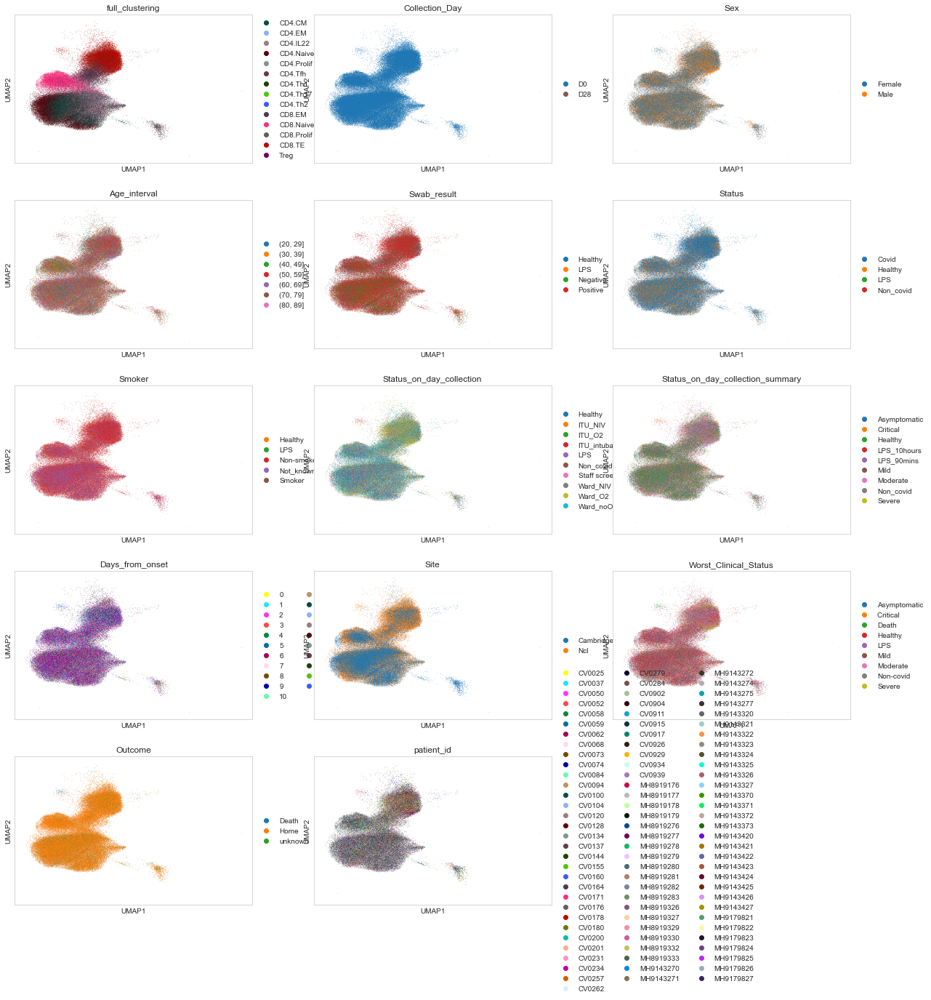

In [16]:
sc.pl.umap(data, color=metadata, ncols=3)

In [17]:
moe_model = models['moe']
latent_moe = moe_model.get_latent(data, metadata=metadata, return_mean=True)
sc.pp.neighbors(latent_moe, use_rep='X')
sc.tl.umap(latent_moe)
data.obsm['X_umap_moe'] = latent_moe.obsm['X_umap']

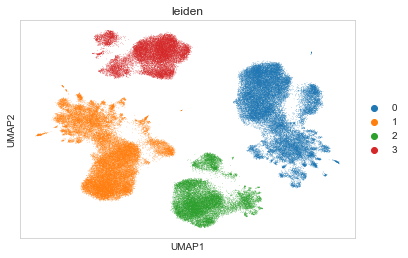

In [18]:
sc.tl.leiden(latent_moe, resolution=0.01)
sc.pl.umap(latent_moe, color='leiden', ncols=3)

In [19]:
data.obs['leiden_moe'] = latent_moe.obs['leiden'].copy()

0
1
2
3


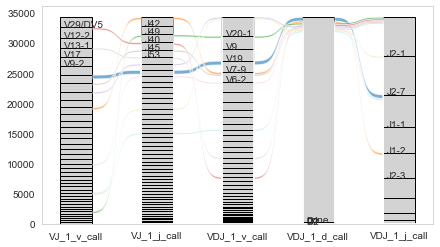

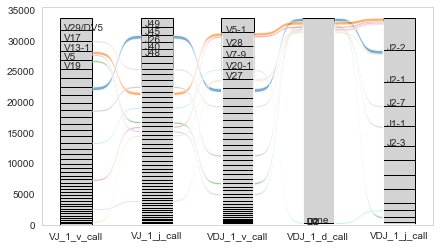

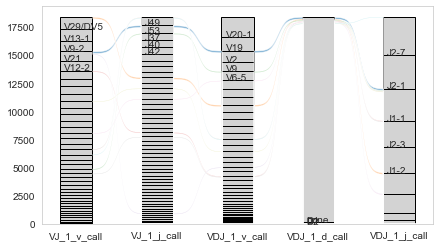

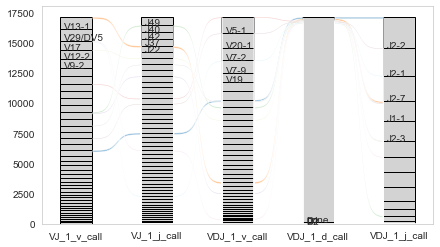

In [20]:
dict_rename = {
    'v_gene_alpha': 'IR_VJ_1_v_call',
    'j_gene_alpha': 'IR_VJ_1_j_call',
    'c_gene_alpha': 'IR_VJ_1_c_call',
    'v_gene_beta': 'IR_VDJ_1_v_call',
    'd_gene_beta': 'IR_VDJ_1_d_call',
    'j_gene_beta': 'IR_VDJ_1_j_call',
    'c_gene_beta': 'IR_VDJ_1_c_call',
}
data.obs = data.obs.rename(columns=dict_rename)

for l in data.obs['leiden_moe'].unique():
    print(l)
    ir.pl.vdj_usage(data[data.obs['leiden_moe']==l])

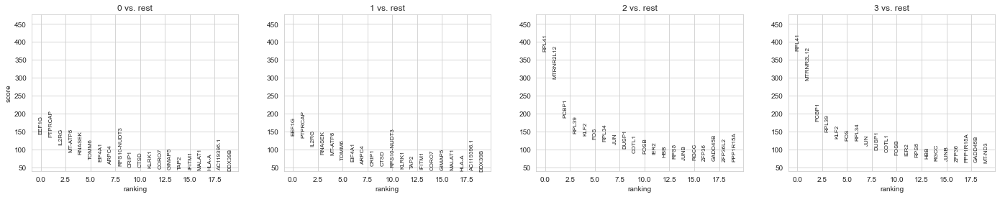

In [21]:
sc.tl.rank_genes_groups(data, groupby='leiden_moe', n_genes=20)
sc.pl.rank_genes_groups(data, groupby='leiden_moe', n_genes=20)

In [22]:
rna_model = models['rna']
latent_rna = rna_model.get_latent(data, metadata=metadata)
sc.pp.neighbors(latent_rna, use_rep='X')
sc.tl.umap(latent_rna)
data.obsm['X_umap_rna'] = latent_rna.obsm['X_umap']

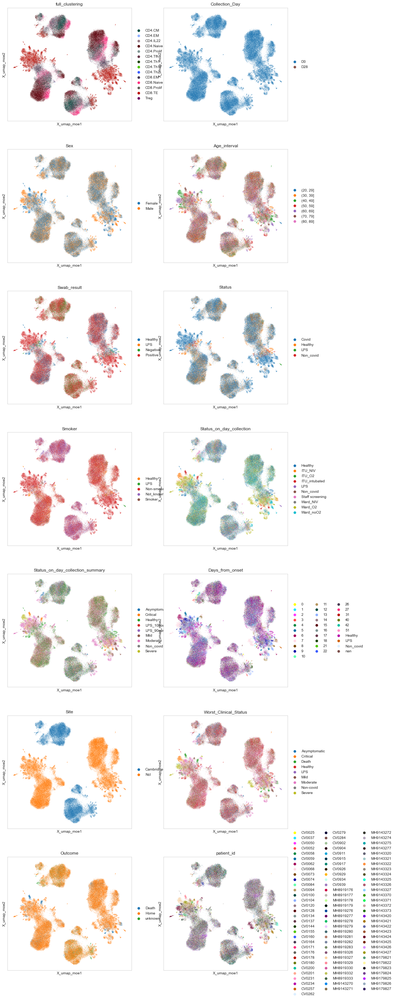

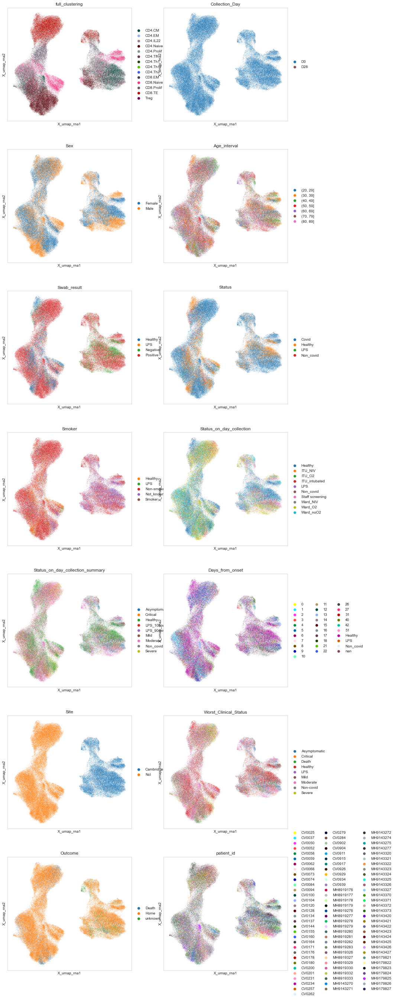

In [23]:
rcParams['figure.figsize'] = (6, 6)
sc.pl.embedding(data, basis='X_umap_moe', color=metadata, ncols=2)
sc.pl.embedding(data, basis='X_umap_rna', color=metadata, ncols=2)

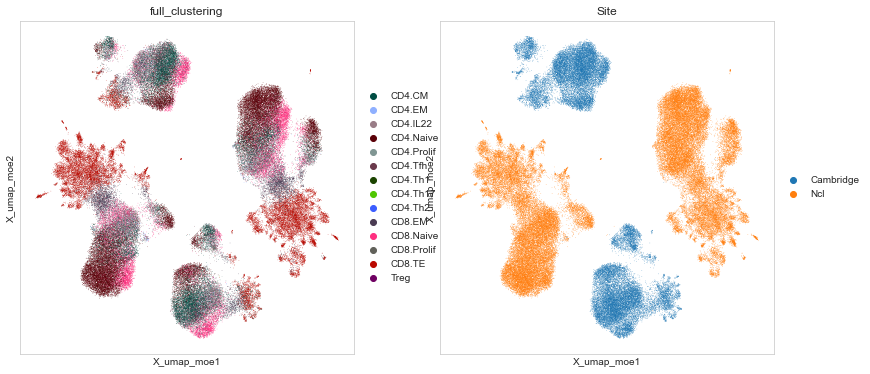

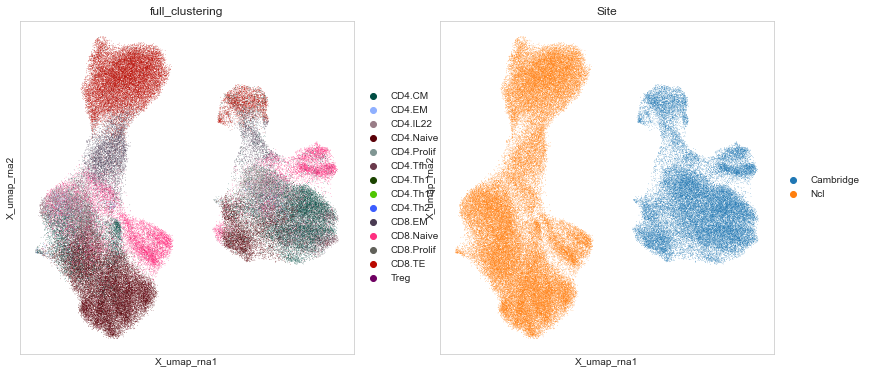

In [24]:
sc.pl.embedding(data, basis='X_umap_moe', color=['full_clustering', 'Site'], ncols=2)
sc.pl.embedding(data, basis='X_umap_rna', color=['full_clustering', 'Site'], ncols=2)

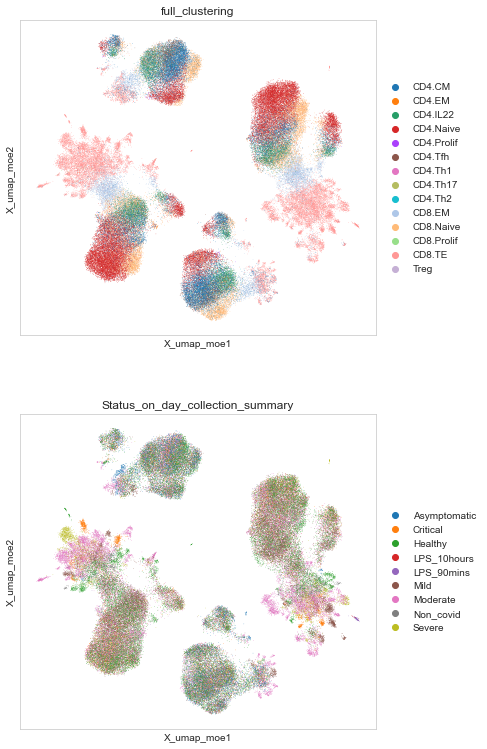

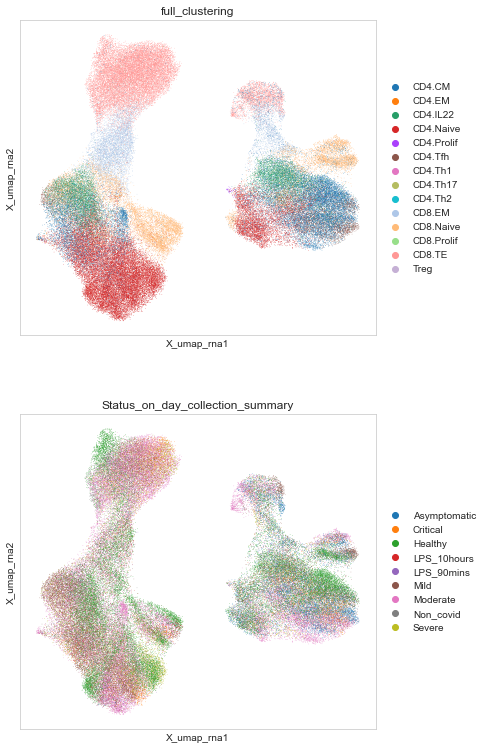

In [25]:
rcParams['figure.figsize'] = (6, 6)
data.uns.pop('full_clustering_colors')
sc.pl.embedding(data, basis='X_umap_moe', color=['full_clustering', 'Status_on_day_collection_summary'], ncols=1)
sc.pl.embedding(data, basis='X_umap_rna', color=['full_clustering', 'Status_on_day_collection_summary'], ncols=1)

## Add Marker Genes / Scores

In [26]:
tcell_markers = pd.read_excel('data/41467_2019_12464_MOESM7_ESM.xlsx', skiprows=1)
tcell_markers

,Treg,CD4 NV/CM,CD4/CD8,IFN Response,Proliferation,CD8 Cytotoxic,CD8 Cytokine
0,LRRC32,CTB-133G6.1,WDR86,IFIT3,PYCR1,CCL5,CCL3
1,RGS1,TMEM45B,IL7R,CMPK2,NPW,GZMK,CCL3L3
2,FOXP3,AK5,TSPAN2,IFIT2,LIF,GNLY,CCL4L2
3,RNF207,NOG,LRRC2,IFI44L,IL2,TRGC2,IFNG
4,CTLA4,NGFRAP1,SNAI3,GBP1,SLC29A1,FGFBP2,CCL4
...,...,...,...,...,...,...,...
65,NTRK2,IL24,ITGB7,RTP4,SH2D4A,SETBP1,PRDM1
66,FAM46C,PLCL1,ACSF2,APOL2,YRDC,COLGALT2,KLRD1
67,KLHL5,LETMD1,ATXN7L1,LPP,C10orf2,KIR2DL4,ST8SIA4
68,IZUMO4,SLC8B1,PINK1,SP110,TRAP1,FKBP1B,IER3


In [27]:
for k, v in tcell_markers.items():
    score_name = k.lower() + "_score"
    data.obs[score_name] = np.mean(
        (
            data[:, [x for x in v if x in data.var_names]].X - 
            data[:, [x for x in v if x in data.var_names]].X.mean(axis=0)
        ) / data[:, [x for x in v if x in data.var_names]].X.todense().std(axis=0),
        axis=1)

In [28]:
expanded_clonotypes = data.obs['clonotype'].value_counts()
expanded_clonotypes = expanded_clonotypes[expanded_clonotypes>=50].index

data.obs['large_clonotype'] = [el if el in expanded_clonotypes
                              else '-99' 
                              for el in data.obs['clonotype']]

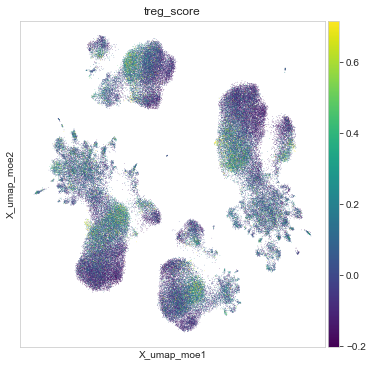

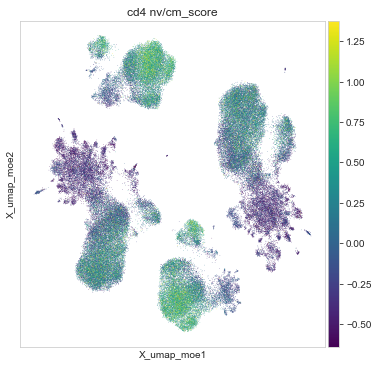

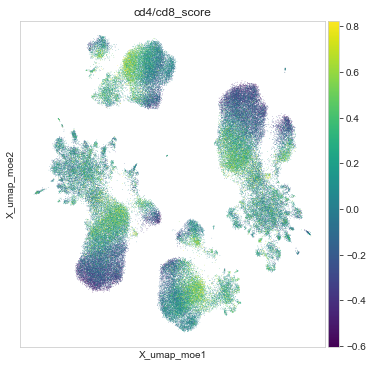

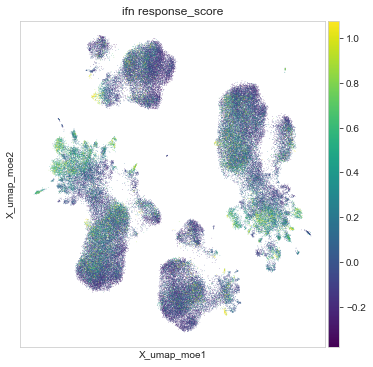

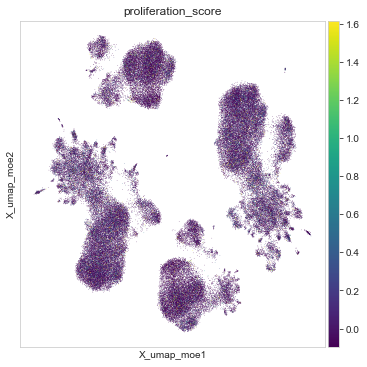

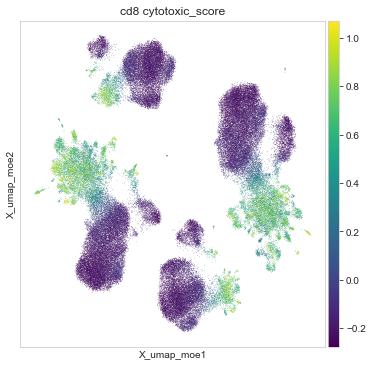

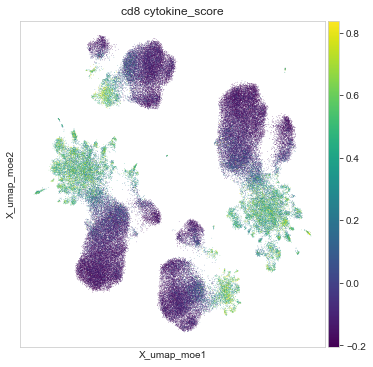

In [29]:
scores = [k.lower() + "_score" for k in tcell_markers]

for score in scores:
    lower, upper = np.percentile(data.obs[score], [1, 99])
    sc.pl.embedding(data, basis='X_umap_moe', color=score, vmin=lower, vmax=upper, cmap='viridis')

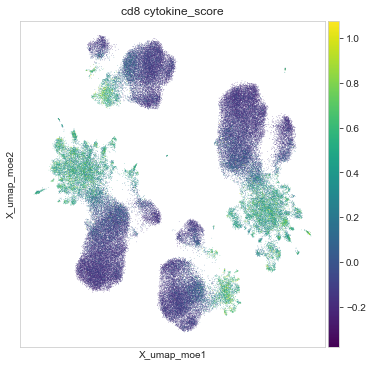

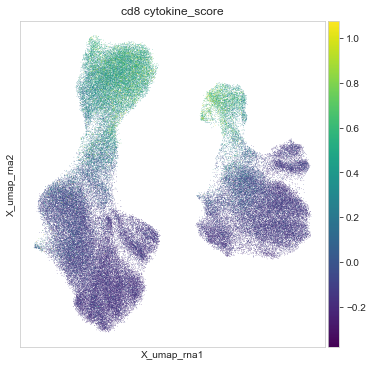

In [30]:
lower, upper = np.percentile(data.obs['ifn response_score'], [1, 99])
sc.pl.embedding(data, basis='X_umap_moe', color=score, vmin=lower, vmax=upper, cmap='viridis')
sc.pl.embedding(data, basis='X_umap_rna', color=score, vmin=lower, vmax=upper, cmap='viridis')

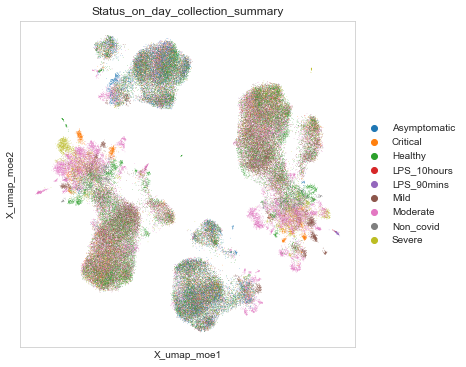

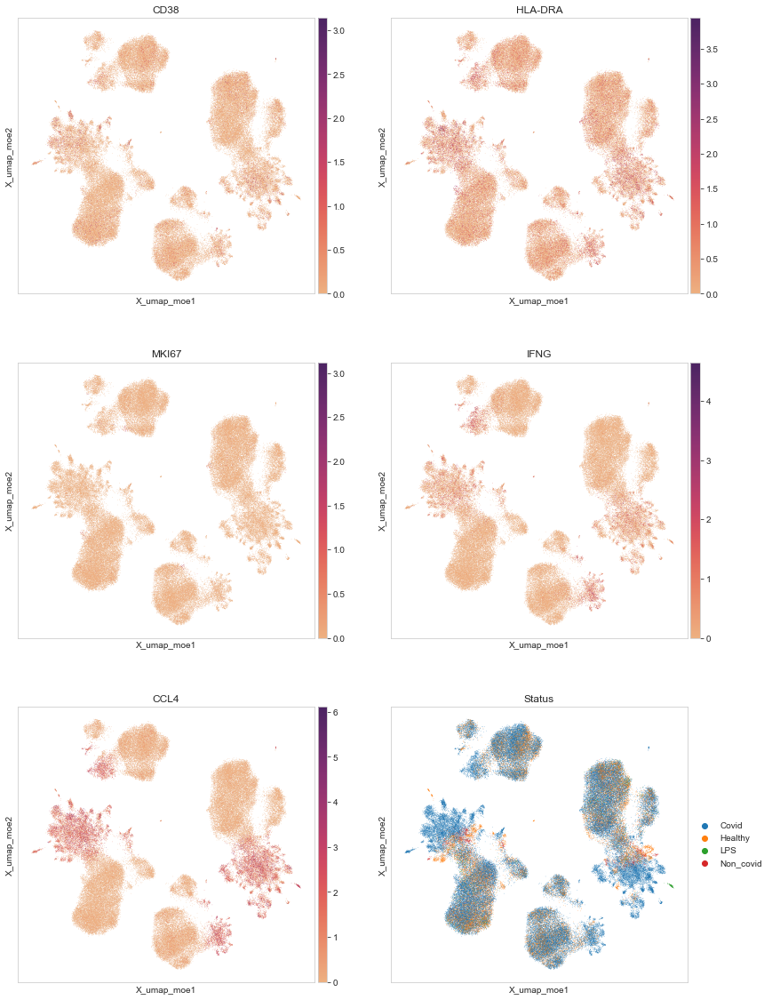

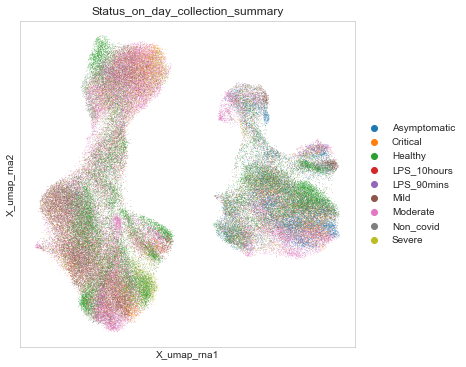

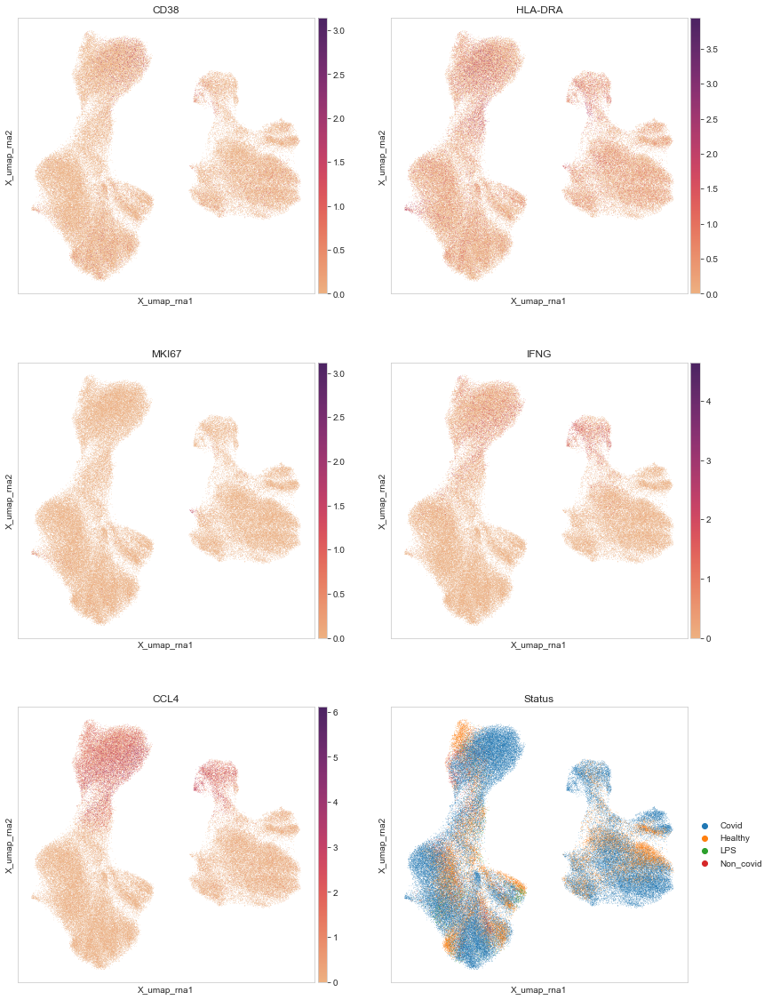

In [31]:
activation_marker = ['CD38', 'HLA-DRA', 'MKI67', 'IFNG', 'CCL4', 'Status']
sc.pl.embedding(data, basis='X_umap_moe', color='Status_on_day_collection_summary', ncols=2, cmap='flare')
sc.pl.embedding(data, basis='X_umap_moe', color=activation_marker, ncols=2, cmap='flare')
sc.pl.embedding(data, basis='X_umap_rna', color='Status_on_day_collection_summary', ncols=2, cmap='flare')
sc.pl.embedding(data, basis='X_umap_rna', color=activation_marker, ncols=2, cmap='flare')

In [32]:
data.obs['large_clonotype'] = data.obs['large_clonotype'].astype(str)
data.obs['large_clonotype'] = data.obs['large_clonotype'].replace('-99', np.nan) 

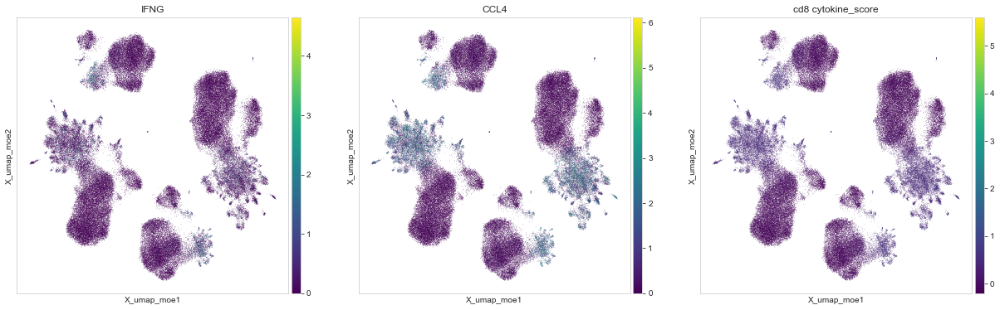

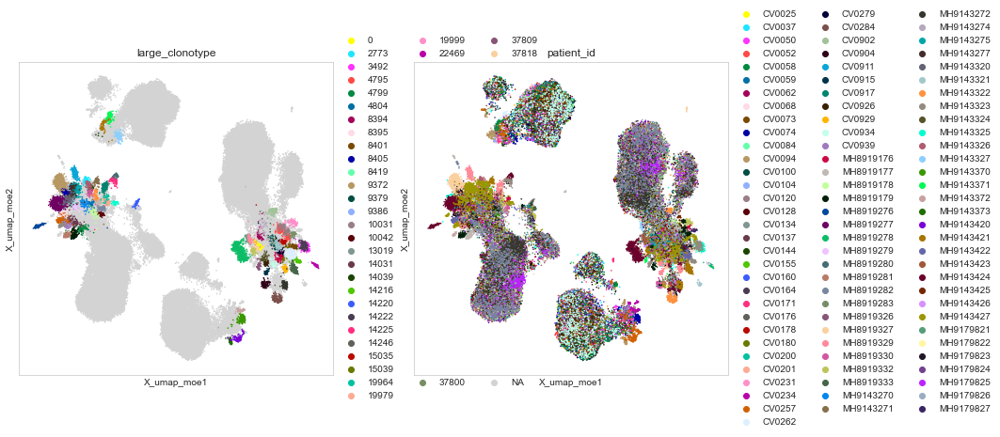

In [33]:
sc.pl.embedding(data, basis='X_umap_moe', color=['IFNG', 'CCL4', 'cd8 cytokine_score'], ncols=3, cmap='viridis')
sc.pl.embedding(data, basis='X_umap_moe', color=['large_clonotype', 'patient_id'], size=10)

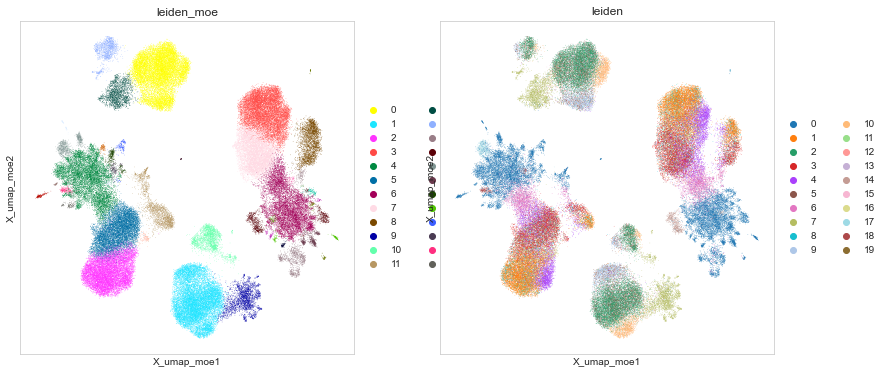

In [34]:
sc.tl.leiden(latent_moe)
sc.pp.neighbors(data)
sc.tl.leiden(data)
data.obs['leiden_moe'] = latent_moe.obs['leiden']
sc.pl.embedding(data, basis='X_umap_moe', color=['leiden_moe', 'leiden'])

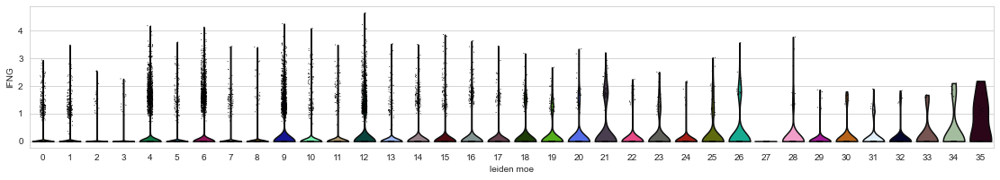

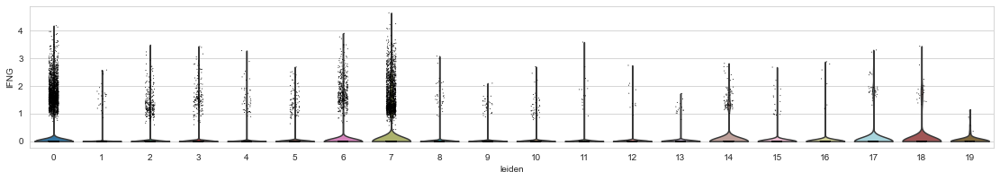

In [35]:
rcParams['figure.figsize'] = (15, 3)
sc.pl.violin(data, keys='IFNG', groupby='leiden_moe', figsize=(20, 3))
sc.pl.violin(data, keys='IFNG', groupby='leiden', figsize=(20, 3))
rcParams['figure.figsize'] = (6, 6)

In [36]:
latent_moe_cd8ef = latent_moe[latent_moe.obs['full_clustering']=='CD8.TE']
sc.pp.neighbors(latent_moe_cd8ef)
sc.tl.leiden(latent_moe_cd8ef, resolution=1)
data.obs['leiden_moe_cd8te'] = latent_moe_cd8ef.obs['leiden']
data_cd8te = data[data.obs['full_clustering']=='CD8.TE']

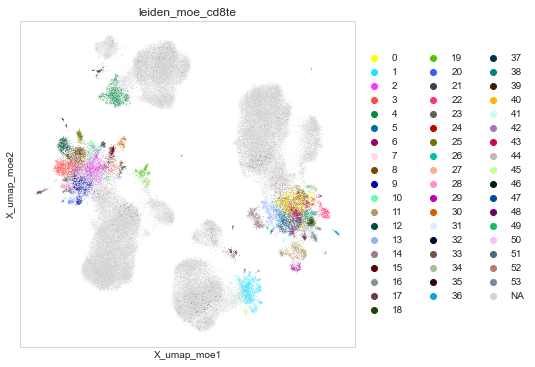

In [37]:
sc.pl.embedding(data, basis='X_umap_moe', color='leiden_moe_cd8te')

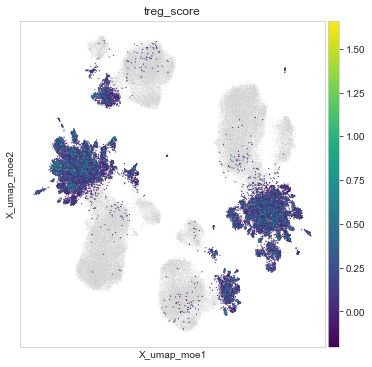

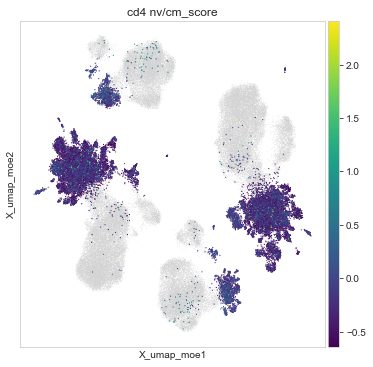

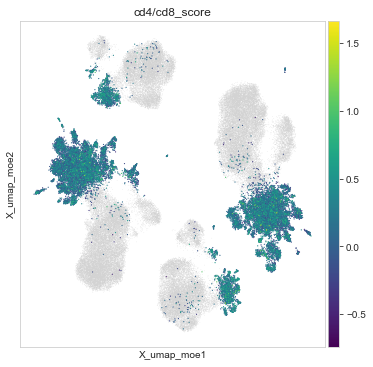

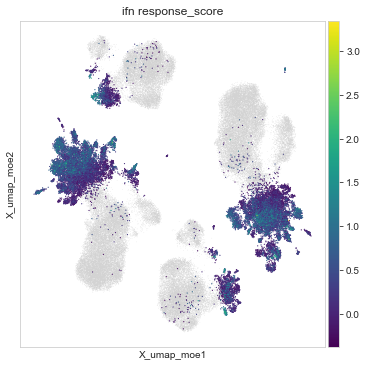

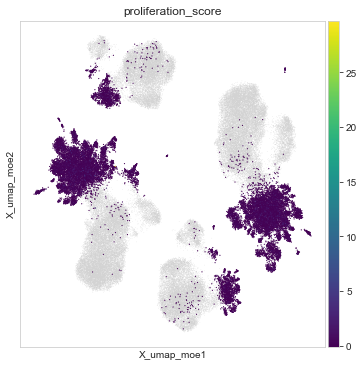

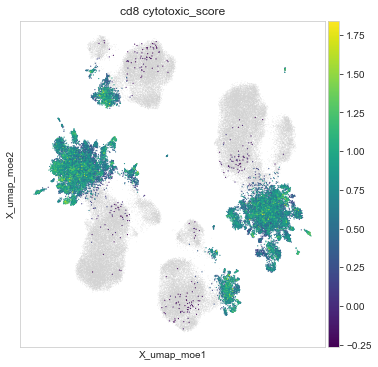

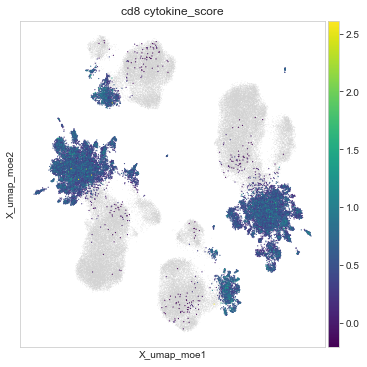

In [38]:
scores = [el for el in data.obs.columns.tolist() if el.endswith('_score')]

for color in scores:
    fig, ax = plt.subplots(1, 1, figsize=(6, 6))

    sc.pl.embedding(data, basis='X_umap_moe', show=False, ax=ax)
    sc.pl.embedding(data_cd8te, basis='X_umap_moe', color=color, ax=ax, show=False, cmap='viridis')
    plt.show()

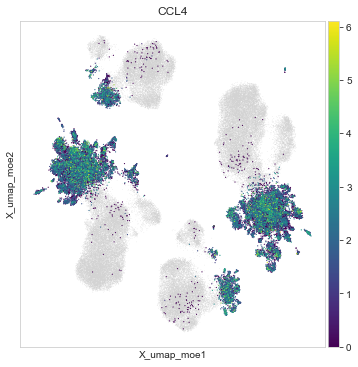

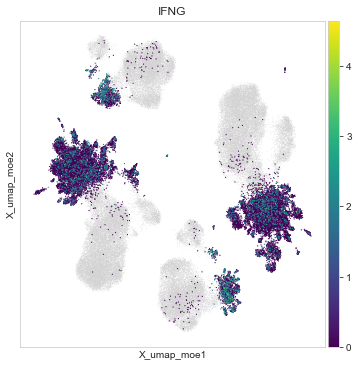

In [39]:
for color in ['CCL4', 'IFNG']:
    fig, ax = plt.subplots(1, 1, figsize=(6, 6))

    sc.pl.embedding(data, basis='X_umap_moe', show=False, ax=ax)
    sc.pl.embedding(data_cd8te, basis='X_umap_moe', color=color, ax=ax, show=False, cmap='viridis')
    plt.show()

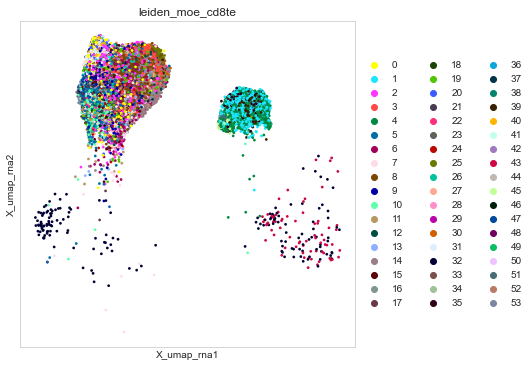

In [40]:
sc.pl.embedding(data_cd8te, basis='X_umap_rna', color='leiden_moe_cd8te', size=30)

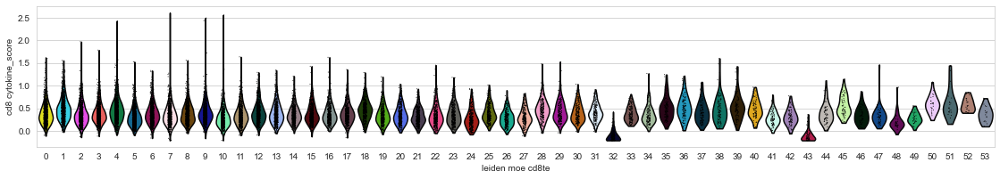

In [41]:
rcParams['figure.figsize'] = (15, 3)
sc.pl.violin(data, keys='cd8 cytokine_score', groupby='leiden_moe_cd8te', figsize=(20, 3))
rcParams['figure.figsize'] = (6, 6)

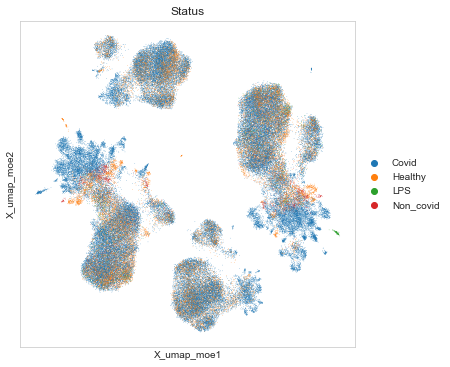

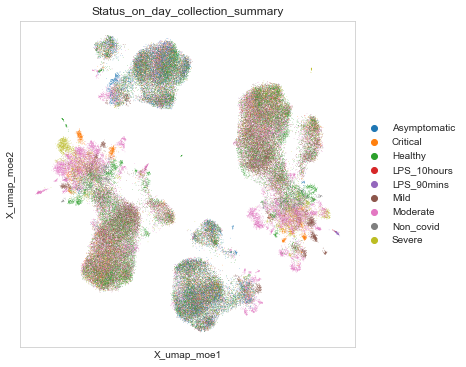

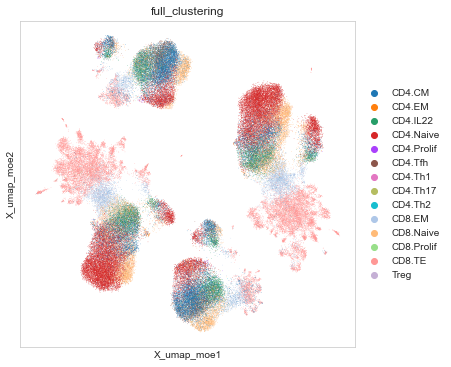

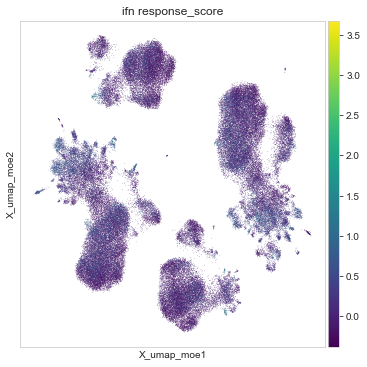

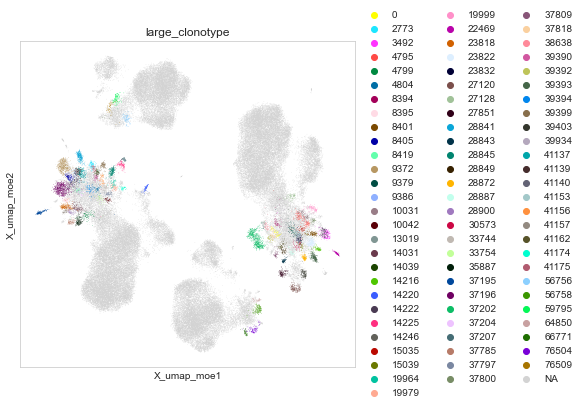

In [42]:
rcParams['figure.figsize'] = (6, 6)
data.uns.pop('full_clustering_colors')
sc.pl.embedding(data, basis='X_umap_moe', color=['Status'])
sc.pl.embedding(data, basis='X_umap_moe', color=['Status_on_day_collection_summary'])
sc.pl.embedding(data, basis='X_umap_moe', color=['full_clustering'])
sc.pl.embedding(data, basis='X_umap_moe', color=['ifn response_score'], cmap='viridis')
sc.pl.embedding(data, basis='X_umap_moe', color=['large_clonotype'], cmap='viridis')


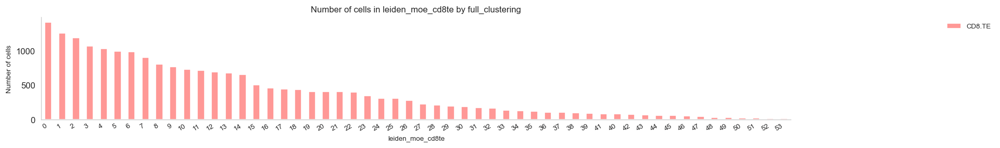

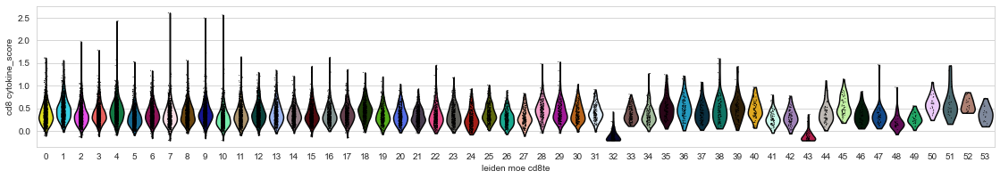

In [43]:
ir.pl.group_abundance(data_cd8te, groupby='leiden_moe_cd8te', target_col='full_clustering', figsize=(20, 3))
rcParams['figure.figsize'] = (15, 3)
sc.pl.violin(data_cd8te, keys='cd8 cytokine_score', groupby='leiden_moe_cd8te', figsize=(20, 3))
rcParams['figure.figsize'] = (6, 6)

In [44]:
ps_by_cluster = {}

score = 'ifn response_score'
for cluster in sorted(data_cd8te.obs['leiden_moe_cd8te'].unique().astype(int)):
    cluster = str(cluster)
    ifn_cluster = data_cd8te[data_cd8te.obs['leiden_moe_cd8te']==cluster].obs[score]
    ifn_rest = data_cd8te[data_cd8te.obs['leiden_moe_cd8te']!=cluster].obs[score]
    
    p_value = scipy.stats.ttest_ind(a=ifn_cluster, b=ifn_rest, equal_var=False, alternative='greater')
    #print(p_value)
    #print(p_value[1])
    ps_by_cluster[cluster] = p_value[1]
    #raise ValueError
ps_by_cluster = pd.DataFrame(data={'p_value': ps_by_cluster.values()}, index=ps_by_cluster.keys(),)
ps_by_cluster.index.name = 'cluster'
ps_by_cluster.head(5)

,p_value
cluster,
0,1.000000e+00
1,1.000000e+00
2,1.000000e+00
3,1.349333e-111
4,9.962611e-01


In [45]:
def map_pvalue_sign(p):
    if p < 0.001:
        return '***'
    if p < 0.01:
        return '**'
    if p < 0.05:
        return '*'
    return ''
ps_by_cluster['sign'] = ps_by_cluster['p_value'].map(map_pvalue_sign)
ps_by_cluster['cluster+sign'] = ps_by_cluster.index + '\n' + ps_by_cluster['sign']
print(ps_by_cluster['sign'].value_counts())
ps_by_cluster.head()

       36
***    15
**      2
*       1
Name: sign, dtype: int64


,p_value,sign,cluster+sign
cluster,,,
0,1.000000e+00,,0\n
1,1.000000e+00,,1\n
2,1.000000e+00,,2\n
3,1.349333e-111,***,3\n***
4,9.962611e-01,,4\n


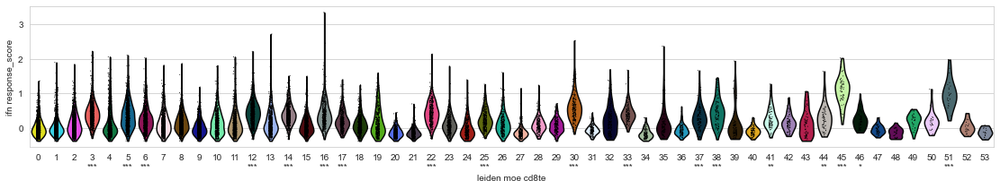

In [46]:
rcParams['figure.figsize'] = (15, 3)
plot = sc.pl.violin(data_cd8te, keys=score, groupby='leiden_moe_cd8te', figsize=(20, 3), show=False)
plot.set_xticklabels(ps_by_cluster['cluster+sign'].values)
rcParams['figure.figsize'] = (6, 6)

In [47]:
react_leiden = ps_by_cluster[ps_by_cluster['sign']=='***'].index

In [48]:
data.uns['p_values_ifn'] = ps_by_cluster
data.uns['reactive_clusters'] = list(react_leiden)

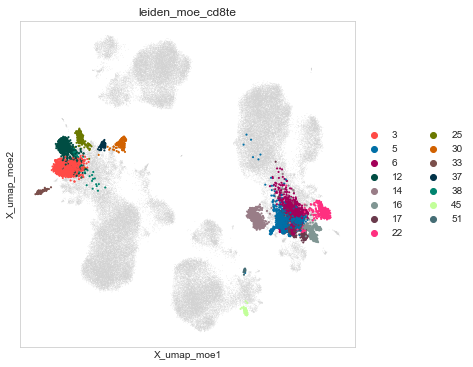

In [49]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))

sc.pl.embedding(data, basis='X_umap_moe', show=False, ax=ax)
sc.pl.embedding(data[data.obs['leiden_moe_cd8te'].isin(react_leiden)], basis='X_umap_moe', 
                color='leiden_moe_cd8te', ax=ax, show=False, cmap='viridis')
plt.show()

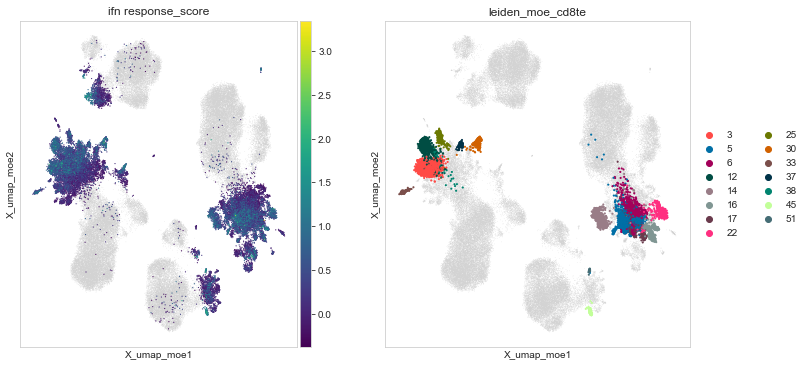

In [50]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

sc.pl.embedding(data, basis='X_umap_moe', show=False, ax=ax[0])
sc.pl.embedding(data_cd8te, basis='X_umap_moe', color=score, ax=ax[0], show=False, cmap='viridis')
sc.pl.embedding(data, show=False, basis='X_umap_moe', ax=ax[1])
sc.pl.embedding(data_cd8te[data_cd8te.obs['leiden_moe_cd8te'].isin(react_leiden)], basis='X_umap_moe',
                color='leiden_moe_cd8te', ax=ax[1], show=False)

plt.show()

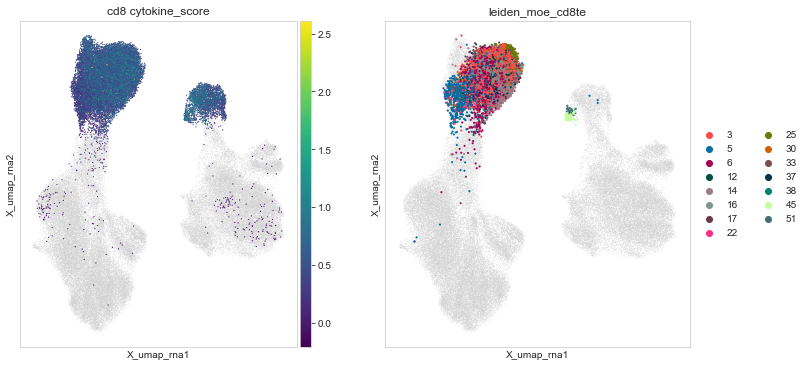

In [51]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

sc.pl.embedding(data, basis='X_umap_rna', show=False, ax=ax[0])
sc.pl.embedding(data_cd8te, basis='X_umap_rna', color='cd8 cytokine_score', ax=ax[0], show=False, cmap='viridis')
sc.pl.embedding(data, basis='X_umap_rna', show=False, ax=ax[1])
sc.pl.embedding(data_cd8te[data_cd8te.obs['leiden_moe_cd8te'].isin(react_leiden)], basis='X_umap_rna',
                color='leiden_moe_cd8te', ax=ax[1], show=False)
plt.show()

Text(0.5, 1.0, 'Cells per reactive cluster')

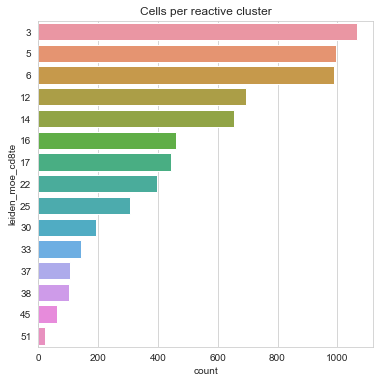

In [52]:
plot = sb.countplot(data=data_cd8te[data_cd8te.obs['leiden_moe_cd8te'].isin(react_leiden.values)].obs, 
                    y='leiden_moe_cd8te')
plot.set_title('Cells per reactive cluster')

In [53]:
data_cd8te.obs['iedb_specie'] = data_cd8te.obs['iedb_specie'].astype(str)
data_cd8te.obs['iedb_specie'].loc[data_cd8te.obs['iedb_specie'].isna()] = 'No Annotation'
data_cd8te.obs['iedb_specie'].loc[data_cd8te.obs['iedb_specie']=='nan'] = 'No Annotation'
data_cd8te.obs['iedb_specie']

AAACCTGAGAAACCTA-MH9179824       No Annotation
AAACCTGGTTGAGTTC-MH9179824       No Annotation
AAAGTAGTCCATGAAC-MH9179824       No Annotation
AACCATGGTGTTTGGT-MH9179824    {"SARS-CoV2": 2}
AACGTTGAGTACGACG-MH9179824       No Annotation
                                    ...       
BGCV13_TCGTAGAAGATCACGG-1        No Annotation
BGCV13_TCTCATAGTTCCCGAG-1     {"SARS-CoV2": 1}
BGCV13_TGCCCTAGTCAACATC-1        No Annotation
BGCV13_TGGGAAGTCCGCTGTT-1        No Annotation
BGCV13_TGGTTAGTCTACTCAT-1        No Annotation
Name: iedb_specie, Length: 21276, dtype: object

Text(0.5, 1.0, 'Unique Clonotypes per cluster')

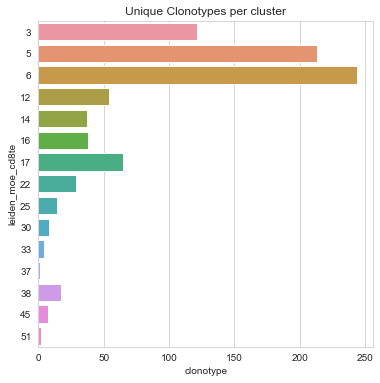

In [54]:
counts = data_cd8te[data_cd8te.obs['leiden_moe_cd8te'].isin(react_leiden.values)].obs.groupby('leiden_moe_cd8te'
                                                                                             )['clonotype']
counts = counts.nunique().reset_index()
plot = sb.barplot(data=counts, x='clonotype', y='leiden_moe_cd8te')
plot.set_title('Unique Clonotypes per cluster')

In [55]:
data.obs.groupby('Swab_result')['iedb_specie'].value_counts(normalize=True, dropna=False)

Swab_result                                                                                                                                                                                                                                                                                                       
Healthy      nan                                                                                                                                                                                                                                                                                                      0.619718
             {"SARS-CoV2": 1}                                                                                                                                                                                                                                                                                         0.075386
             {"Human herpesvirus 5 (Human cytomegalovir

<AxesSubplot:title={'center':'Number of cells in leiden_moe_cd8te by Status'}, xlabel='leiden_moe_cd8te', ylabel='Number of cells'>

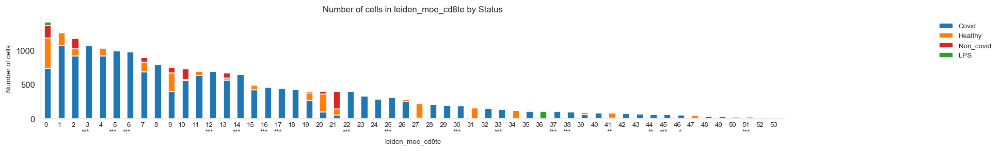

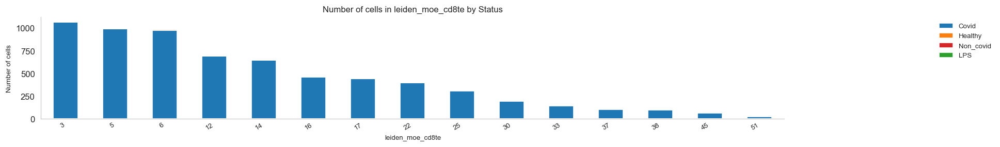

In [56]:
plot = ir.pl.group_abundance(data_cd8te, 'leiden_moe_cd8te', 'Status', figsize=(20, 3))
plot.set_xticklabels(ps_by_cluster['cluster+sign'].values, rotation=0)

ir.pl.group_abundance(data_cd8te[data_cd8te.obs['leiden_moe_cd8te'].isin(react_leiden)], 'leiden_moe_cd8te',
                      'Status', figsize=(20, 3))


<AxesSubplot:title={'center':'Number of cells in leiden_moe_cd8te by Status_on_day_collection_summary'}, xlabel='leiden_moe_cd8te', ylabel='Number of cells'>

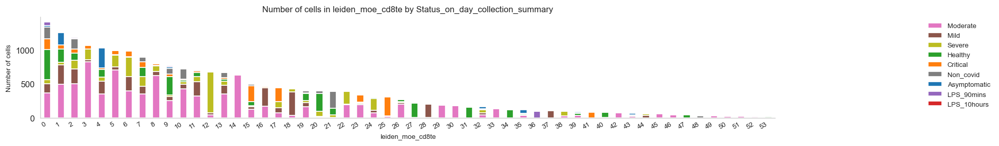

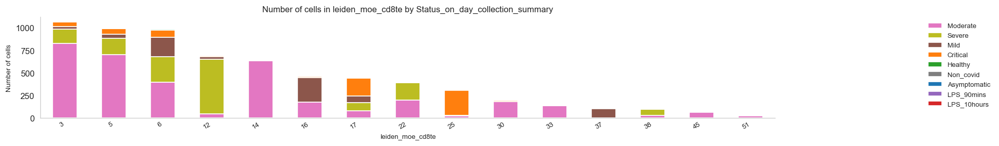

In [57]:
ir.pl.group_abundance(data_cd8te, 'leiden_moe_cd8te', 'Status_on_day_collection_summary', figsize=(20, 3))
ir.pl.group_abundance(data_cd8te[data_cd8te.obs['leiden_moe_cd8te'].isin(react_leiden)], 'leiden_moe_cd8te', 
                      'Status_on_day_collection_summary', figsize=(20, 3))


In [58]:
metadata = [
       'full_clustering',
       'Collection_Day', 'Sex',
       'Age_interval', 'Swab_result', 'Status', 'Smoker',
       'Status_on_day_collection', 'Status_on_day_collection_summary',
       'Days_from_onset', 'Site', 'Worst_Clinical_Status',
       'Outcome', 'patient_id', ]

In [59]:
len(react_leiden)

15

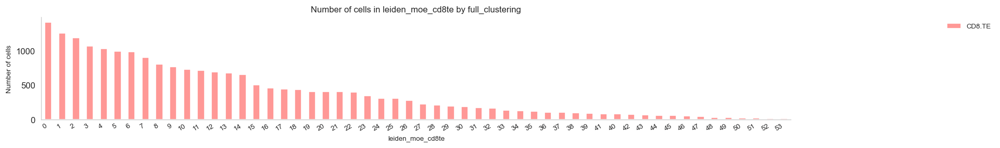

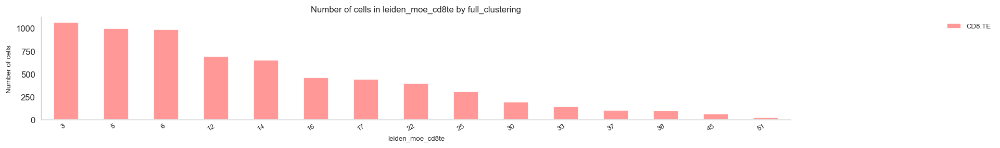

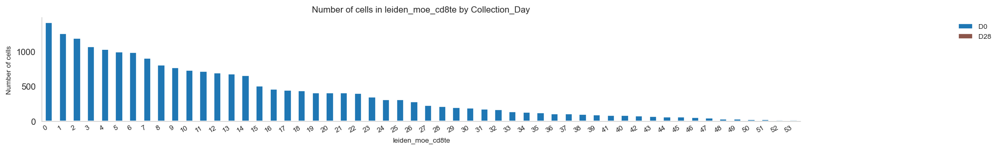

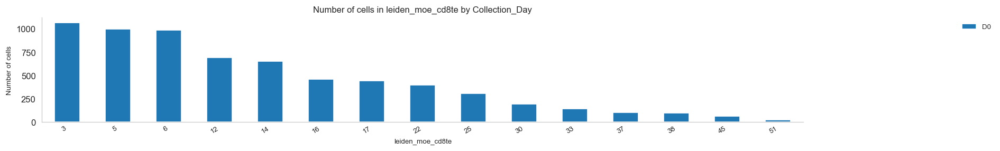

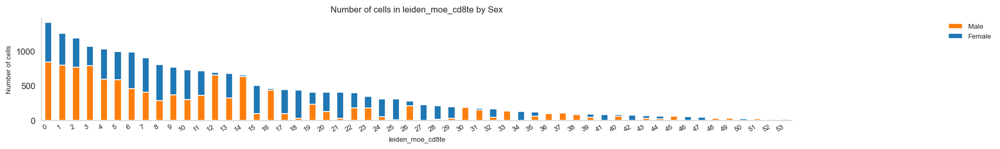

...

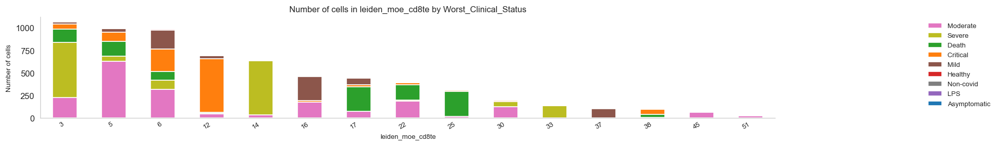

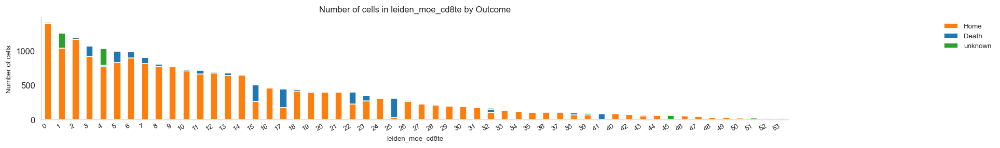

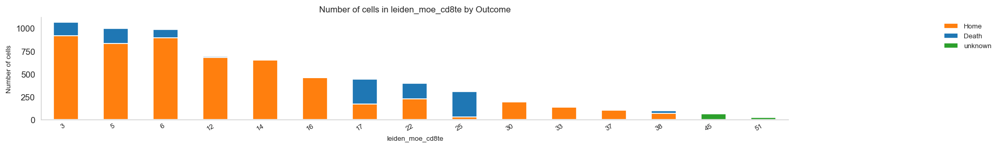

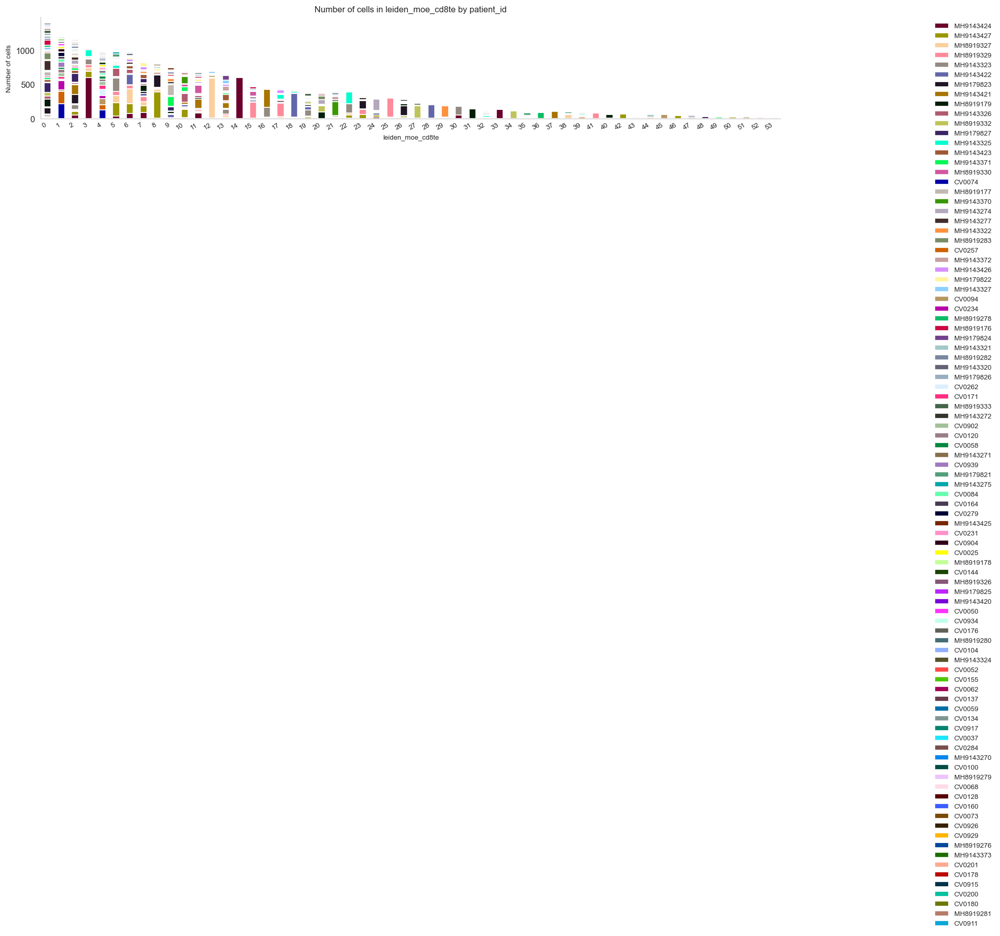

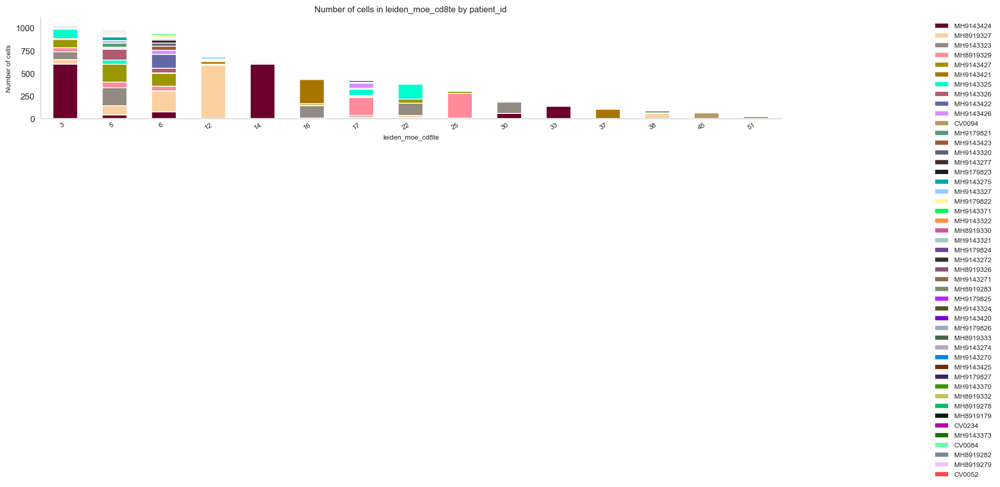

In [60]:
for col in metadata:
    ir.pl.group_abundance(data_cd8te, 'leiden_moe_cd8te', col, figsize=(20, 3))
    ir.pl.group_abundance(data_cd8te[data_cd8te.obs['leiden_moe_cd8te'].isin(react_leiden)], 'leiden_moe_cd8te', 
                          col, figsize=(20, 3))

<AxesSubplot:title={'center':'Number of cells in leiden_moe_cd8te by days_from_onset_grouped'}, xlabel='leiden_moe_cd8te', ylabel='Number of cells'>

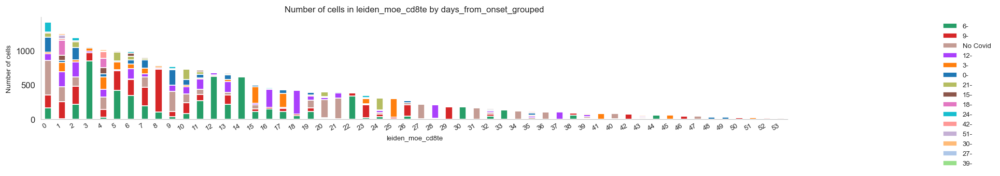

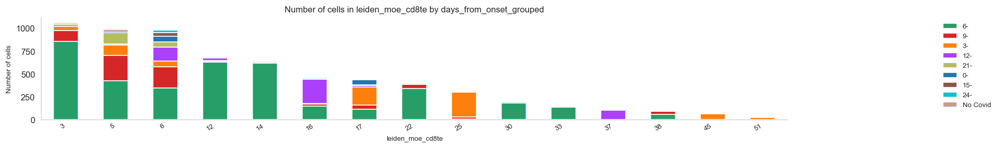

In [61]:
data_cd8te.obs['days_from_onset_grouped'] = [f'{(int(el)//3)*3}-' if el.isnumeric() else 'No Covid' for el in 
                                            data_cd8te.obs['Days_from_onset']]
data_cd8te.obs['days_from_onset_grouped'] = data_cd8te.obs['days_from_onset_grouped'].astype(str)
ir.pl.group_abundance(data_cd8te, 'leiden_moe_cd8te', 'days_from_onset_grouped', figsize=(20, 3))
ir.pl.group_abundance(data_cd8te[data_cd8te.obs['leiden_moe_cd8te'].isin(react_leiden)], 'leiden_moe_cd8te', 
                      'days_from_onset_grouped', figsize=(20, 3))

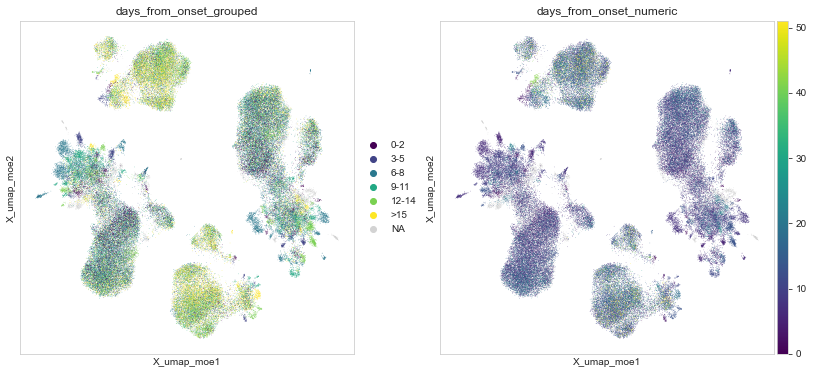

In [62]:
data.obs['days_from_onset_numeric'] = [float(el) if el.isnumeric() else np.nan for el in 
                                            data.obs['Days_from_onset']]
data.obs['days_from_onset_grouped'] = [f'{(int(el)//3)*3}-{(1+int(el)//3)*3-1}' if el.isnumeric() and int(el) < 15
                                       else '>15' if el.isnumeric()
                                       else np.nan for el in 
                                            data.obs['Days_from_onset']]

sc.pl.embedding(data, basis='X_umap_moe', color=['days_from_onset_grouped', 'days_from_onset_numeric'], 
                palette='viridis', cmap='viridis')

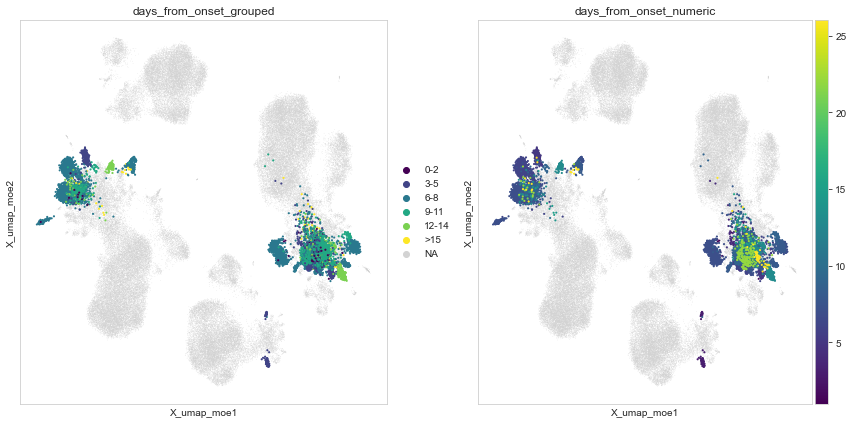

In [63]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

for i, col in enumerate(['days_from_onset_grouped', 'days_from_onset_numeric']):
    sc.pl.embedding(data, basis='X_umap_moe', show=False, ax=ax[i])
    sc.pl.embedding(data[data.obs['leiden_moe_cd8te'].isin(react_leiden)], basis='X_umap_moe', 
                    color=col, palette='viridis', cmap='viridis',
                    show=False, ax=ax[i])
fig.tight_layout()
plt.show()

<AxesSubplot:xlabel='leiden_moe_cd8te', ylabel='days_from_onset_numeric'>

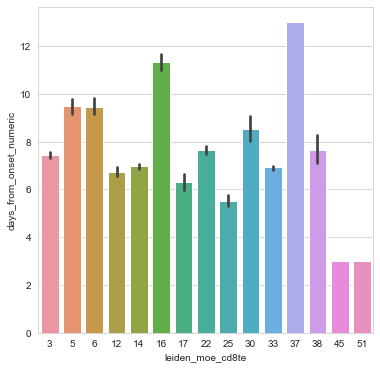

In [64]:
data.obs['days_from_onset_numeric'] = data.obs['days_from_onset_numeric'].astype(float)
sb.barplot(data=data[data.obs['leiden_moe_cd8te'].isin(react_leiden)].obs, 
           x='leiden_moe_cd8te',
           y='days_from_onset_numeric')

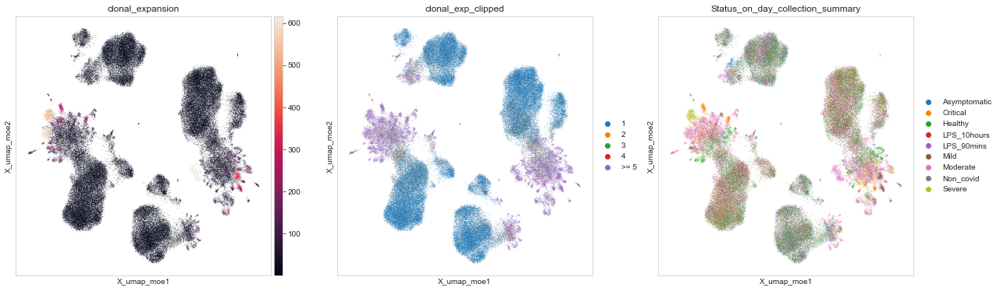

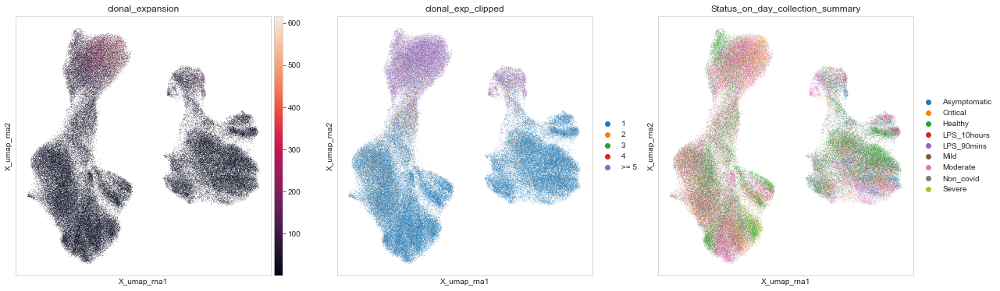

In [65]:
ir.tl.clonal_expansion(data, target_col='clonotype', clip_at=len(data))
ir.tl.clonal_expansion(data, target_col='clonotype', clip_at=5, key_added='clonal_exp_clipped')
data.obs['clonal_expansion'] = data.obs['clonal_expansion'].astype(int)
sc.pl.embedding(data, basis='X_umap_moe', color=['clonal_expansion', 'clonal_exp_clipped', 
                                                 'Status_on_day_collection_summary'])
sc.pl.embedding(data, basis='X_umap_rna', color=['clonal_expansion', 'clonal_exp_clipped',
                                                 'Status_on_day_collection_summary'])

## HLA Typing

In [66]:
hla_data = pd.read_csv('../data/S2_haniffa_hla.txt', sep='\t', index_col='sample_id')
for col in hla_data.columns.tolist():
    col_vals = hla_data[col]
    data.obs[col] = data.obs['patient_id'].map(col_vals)
    
for mhc in ['HLA.A', 'HLA.B', 'HLA.C']:
    mhc_name = mhc.replace('.', '-')
    data.obs[mhc] = mhc_name + data.obs[mhc].str.split('|').str[0] + '|' + mhc_name + data.obs[mhc].str.split('|').str[1]

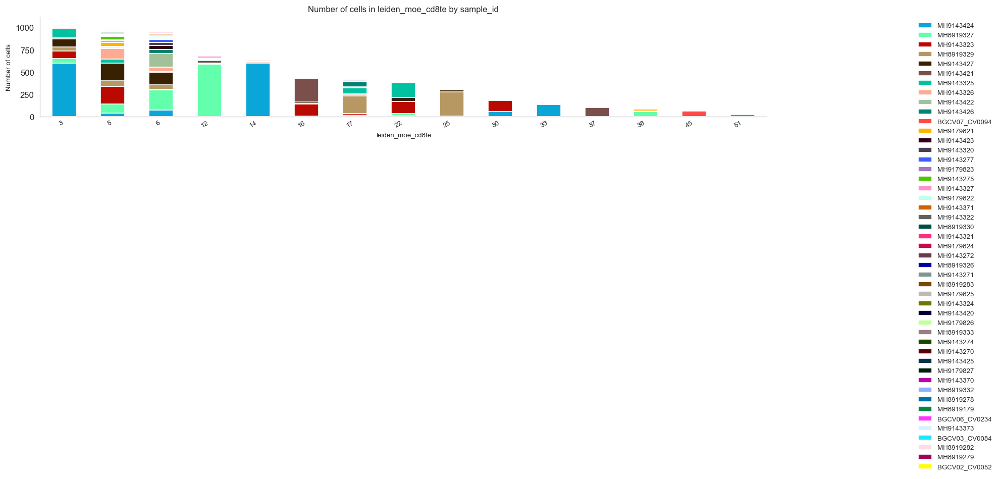

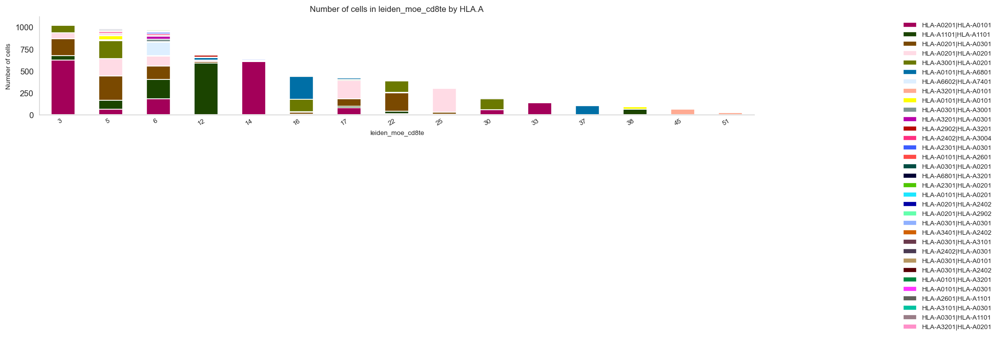

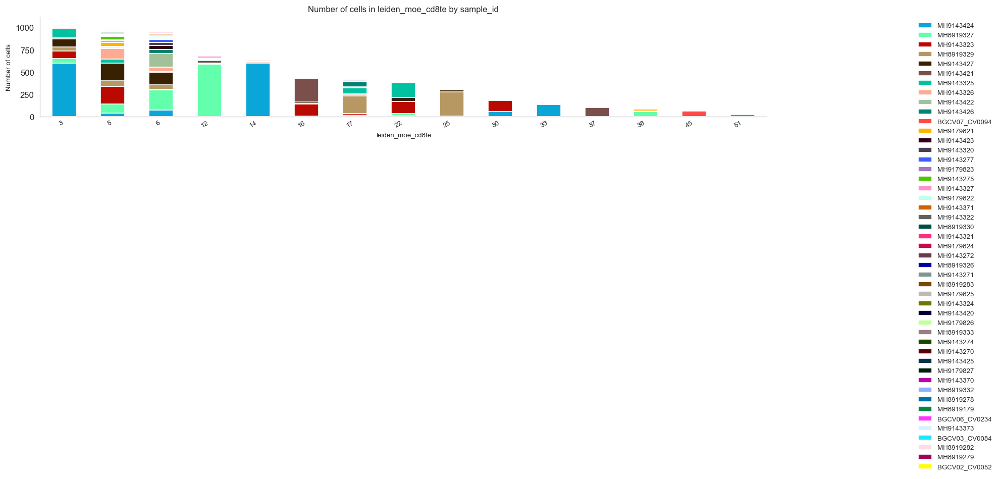

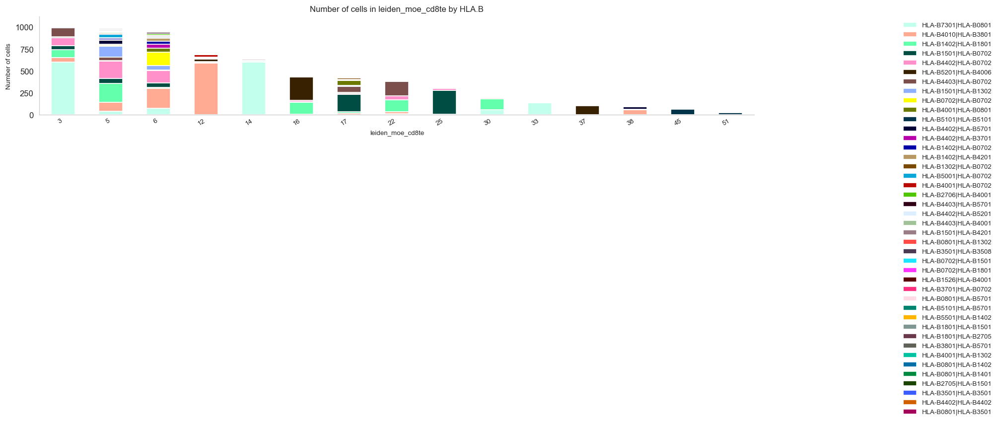

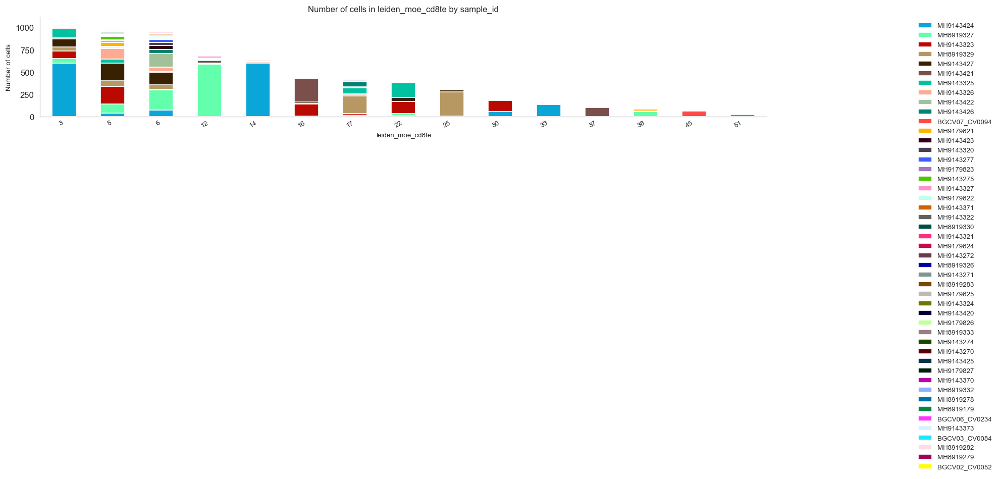

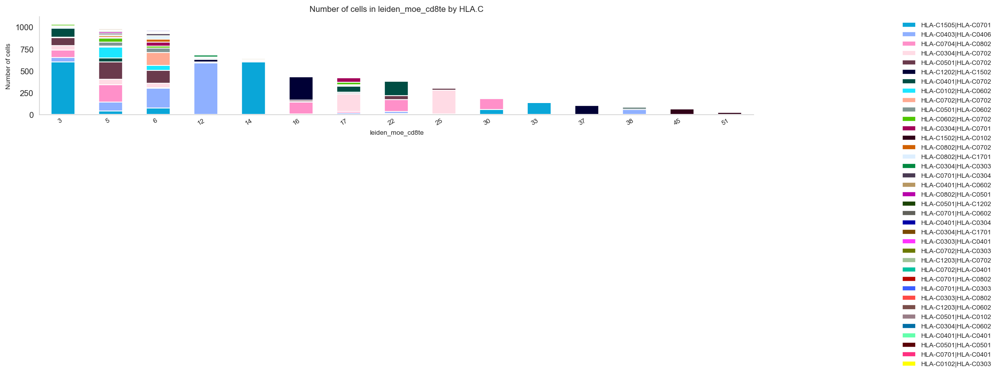

In [67]:
for col in ['HLA.A', 'HLA.B', 'HLA.C']:
    ir.pl.group_abundance(data[data.obs['leiden_moe_cd8te'].isin(react_leiden)], 'leiden_moe_cd8te',
                          'sample_id', figsize=(20, 3))
    ir.pl.group_abundance(data[data.obs['leiden_moe_cd8te'].isin(react_leiden)], 'leiden_moe_cd8te',
                          col, figsize=(20, 3))

In [68]:
import scipy

In [69]:
data.obs['iedb_epitope']

AAACCTGAGAAACCTA-MH9179824                                                  NaN
AAACCTGAGAGTAATC-MH9179824                                                  NaN
AAACCTGAGAGTGAGA-MH9179824           {"VQPTESIVRFPNITNLCPF": 1, "ILGLPTQTV": 1}
AAACCTGAGGAATCGC-MH9179824                     {"MIELSLIDFYLCFLAFLLFLVLIML": 1}
AAACCTGAGTGTTGAA-MH9179824                                                  NaN
                                                    ...                        
BGCV13_TGTATTCGTCTAGCGC-1     {"FQPQNGQFI": 1, "KAYNVTQAF": 2, "MGYINVFAFPFT...
BGCV13_TGTATTCTCGGAATCT-1                                      {"KLGGALQAK": 1}
BGCV13_TGTCCCAAGTATTGGA-1     {"VTIAEILLI": 1, "MVMCGGSLYV": 1, "IMLIIFWFSL"...
BGCV13_TGTCCCAGTACAAGTA-1      {"MPASWVMRI": 1, "MIELSLIDFYLCFLAFLLFLVLIML": 1}
BGCV13_TGTCCCAGTCAAAGCG-1                                                   NaN
Name: iedb_epitope, Length: 103761, dtype: category
Categories (17312, object): ['{"AEIRASANLAATK": 1, "FLWLLWPVTLACFVLA

In [70]:
def majority_hla(hla_type, verbose=False):
    if verbose:
        print(hla_type)
    hla_dict = {
            'leiden': [],
            'hla_type': [],
            'hla_max': [],
            'hal_max_val': [],
            'n_leiden': [],
            'max_donor': [],
            'hla_total': [],
            'p_total': [],
            'p_donor': [],
        }
    for leiden in react_leiden:
        hlas_tmp = data[data.obs['leiden_moe_cd8te']==leiden].obs[hla_type].str.split('|', expand=True)
        unique_hlas = list(set(hlas_tmp[0].unique().tolist() + hlas_tmp[1].unique().tolist()))

        max_hla = None
        max_val = None
        for hla in unique_hlas:
            count = np.sum((hlas_tmp[0]==hla) | (hlas_tmp[1]==hla))
            if max_val is None or max_val < count:
                max_val = count
                max_hla = hla
        max_donor = data[data.obs['leiden_moe_cd8te']==leiden].obs['sample_id'].value_counts().head(1).values[0]
        total = np.sum(data.obs[hla_type].str.contains(max_hla))
        if verbose:
            print(f'  Leiden {leiden}: {max_hla} in {max_val/len(hlas_tmp):.2f} of cells' 
                  + f'(donor {max_donor/len(hlas_tmp):.2f}) '
                  + f'(total {total/len(data):.2f})')
        
        hla_dict['hla_type'].append(hla_type)
        hla_dict['leiden'].append(leiden)
        hla_dict['hla_max'].append(max_hla)
        hla_dict['hal_max_val'].append(max_val)
        hla_dict['n_leiden'].append(len(hlas_tmp))
        hla_dict['max_donor'].append(max_donor)
        hla_dict['hla_total'].append(total)
        
        p_total = scipy.stats.binom_test(x=max_val, n=len(hlas_tmp), p=total/len(data))
        p_donor = scipy.stats.binom_test(x=max_val, n=len(hlas_tmp), p=max_donor/len(hlas_tmp))
        hla_dict['p_total'].append(p_total)
        hla_dict['p_donor'].append(p_donor)
        
    hla_dict = pd.DataFrame(hla_dict) 
    return hla_dict

hla_usage = []
for t in ['HLA.A', 'HLA.B', 'HLA.C']:
    hla_usage.append(majority_hla(t, verbose=False))

hla_usage = pd.concat(hla_usage)
hla_usage = hla_usage.reset_index(drop=True)
hla_usage['hal_max_%'] = hla_usage['hal_max_val'] / hla_usage['n_leiden']
hla_usage['hal_total_%'] = hla_usage['hla_total'] / len(data)
hla_usage['p_total_sign'] = hla_usage['p_total'].map(map_pvalue_sign)
hla_usage['p_donor_sign'] = hla_usage['p_donor'].map(map_pvalue_sign)
hla_usage.head()

,leiden,hla_type,hla_max,hal_max_val,n_leiden,max_donor,hla_total,p_total,p_donor,hal_max_%,hal_total_%,p_total_sign,p_donor_sign
0,3,HLA.A,HLA-A0201,982,1067,602,50933,1.385714e-201,6.830613e-148,0.920337,0.490868,***,***
1,5,HLA.A,HLA-A0201,765,997,201,50933,1.732820e-71,4.693624e-322,0.767302,0.490868,***,***
2,6,HLA.A,HLA-A0201,484,989,221,50933,9.492876e-01,7.458484e-75,0.489383,0.490868,,***
3,12,HLA.A,HLA-A1101,589,694,589,9116,0.000000e+00,1.000000e+00,0.848703,0.087856,***,
4,14,HLA.A,HLA-A0201,623,653,603,50933,5.026787e-150,2.447436e-03,0.954058,0.490868,***,**


In [71]:
hla_usage['p_donor_sign'].value_counts()

       27
***    17
**      1
Name: p_donor_sign, dtype: int64

<AxesSubplot:xlabel='leiden', ylabel='hal_max_%'>

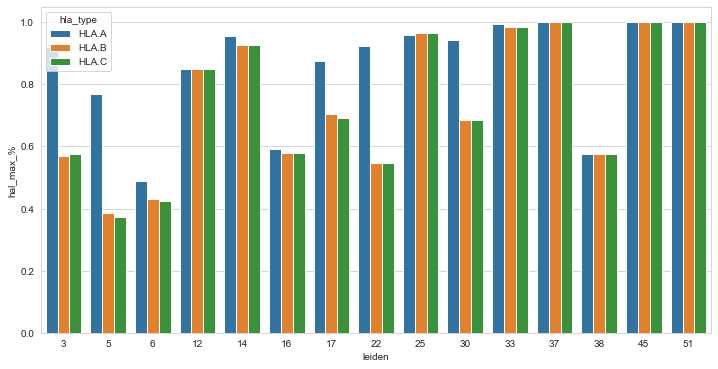

In [72]:
rcParams['figure.figsize'] = (12, 6)
sb.barplot(data=hla_usage, y='hal_max_%', x='leiden', hue='hla_type')

In [73]:
hla_usage

,leiden,hla_type,hla_max,hal_max_val,n_leiden,max_donor,hla_total,p_total,p_donor,hal_max_%,hal_total_%,p_total_sign,p_donor_sign
0,3,HLA.A,HLA-A0201,982,1067,602,50933,1.385714e-201,6.830613e-148,0.920337,0.490868,***,***
1,5,HLA.A,HLA-A0201,765,997,201,50933,1.732820e-71,4.693624e-322,0.767302,0.490868,***,***
2,6,HLA.A,HLA-A0201,484,989,221,50933,9.492876e-01,7.458484e-75,0.489383,0.490868,,***
3,12,HLA.A,HLA-A1101,589,694,589,9116,0.000000e+00,1.000000e+00,0.848703,0.087856,***,
4,14,HLA.A,HLA-A0201,623,653,603,50933,5.026787e-150,2.447436e-03,0.954058,0.490868,***,**
5,16,HLA.A,HLA-A0101,271,459,265,29382,1.107104e-42,6.033284e-01,0.590414,0.283170,***,
6,17,HLA.A,HLA-A0201,388,444,197,50933,4.434484e-65,8.513991e-80,0.873874,0.490868,***,***
7,22,HLA.A,HLA-A0201,368,398,166,50933,6.654284e-78,2.103311e-102,0.924623,0.490868,***,***
8,25,HLA.A,HLA-A0201,295,308,273,50933,3.302591e-73,1.367812e-05,0.957792,0.490868,***,***
9,30,HLA.A,HLA-A0201,182,193,124,50933,1.018584e-42,6.531676e-23,0.943005,0.490868,***,***


# Epitopes

In [74]:
def count_plots_disease(disease_counts):
    plot = disease_counts.plot(kind='bar', stacked=True)
    plot.legend(bbox_to_anchor =(0.65, 1.25))
    plt.show()
    disease_counts_norm = disease_counts.copy()
    disease_counts_norm = disease_counts_norm.div(disease_counts_norm.sum(axis=1), axis=0)
    plot = disease_counts_norm.plot(kind='bar', stacked=True)
    plot.legend(bbox_to_anchor =(0.65, 1.))
    disease_counts_ct = disease_by_leiden.copy()
    num_cells = data[data.obs['leiden_moe_cd8te'].isin(react_leiden)
                                      ].obs['leiden_moe_cd8te'].value_counts().values
    disease_counts_ct = disease_counts_ct.div(num_cells, axis=0)
    plot = disease_counts_ct.plot(kind='bar', stacked=True)
    plot.legend(bbox_to_anchor =(0.65, 1.))
    return disease_counts_norm, disease_counts_ct

In [75]:
aminos = 'ARNDCEQGHILKMFPSTWYV'
def valid_sequence(seq):
    valids = sum([let in aminos for let in seq])
    if valids==len(seq):
        return True
    else:
        print(seq)
        return False

In [76]:
unavailable_mhcs = ['HLA-B1526']

In [77]:
hla_by_donor = hla_data.copy()

for col in ['HLA.A', 'HLA.B', 'HLA.C']:
    hla_by_donor[f'{col}_1'] = col.replace('.', '-') + hla_by_donor[col].str.split('|').str[0]
    hla_by_donor[f'{col}_2'] = col.replace('.', '-') + hla_by_donor[col].str.split('|').str[1] 

hla_by_donor = hla_by_donor[['HLA.A_1', 'HLA.A_2', 'HLA.B_1', 'HLA.B_2', 'HLA.C_1', 'HLA.C_2']]
hla_by_donor = hla_by_donor.transpose().to_dict()
hla_by_donor = {donor: list(set([v for k, v in hla_dict.items() if v not in unavailable_mhcs])) 
                for donor, hla_dict in hla_by_donor.items()}
hla_by_donor

{'AP1': ['HLA-B5201',
  'HLA-C0802',
  'HLA-A0101',
  'HLA-C1202',
  'HLA-B1402',
  'HLA-A0201'],
 'AP10': ['HLA-C0802',
  'HLA-B5601',
  'HLA-C0102',
  'HLA-B1402',
  'HLA-A3301',
  'HLA-A0201'],
 'AP11': ['HLA-C1203',
  'HLA-B4403',
  'HLA-B3508',
  'HLA-C0401',
  'HLA-A6901',
  'HLA-A2301'],
 'AP12': ['HLA-C1203',
  'HLA-B3508',
  'HLA-C0401',
  'HLA-B3503',
  'HLA-A6901',
  'HLA-A0201'],
 'AP13': ['HLA-A0101',
  'HLA-A6801',
  'HLA-C0602',
  'HLA-B0801',
  'HLA-B3701',
  'HLA-C0701'],
 'AP2': ['HLA-B3502', 'HLA-A0301', 'HLA-A2402', 'HLA-C0401'],
 'AP3': ['HLA-B3501', 'HLA-A0301', 'HLA-A1101', 'HLA-C0401'],
 'AP4': ['HLA-C1203',
  'HLA-C1502',
  'HLA-B4002',
  'HLA-B3503',
  'HLA-A0201',
  'HLA-A2402'],
 'AP5': ['HLA-A3401', 'HLA-C1502', 'HLA-C0702', 'HLA-B4002', 'HLA-B5101'],
 'AP6': ['HLA-A0101',
  'HLA-B0801',
  'HLA-B4001',
  'HLA-C0304',
  'HLA-A0201',
  'HLA-C0701'],
 'AP7': ['HLA-C0702', 'HLA-A3401', 'HLA-A1101', 'HLA-B3802'],
 'AP8': ['HLA-A0101', 'HLA-B0801', 'HLA-A3201', '

In [78]:
from functools import reduce

epitopes_by_donor = data[~data.obs['iedb_epitope'].isna() & ~data.obs['leiden_moe_cd8te'].isna()
                        ].obs[['patient_id', 'iedb_epitope']].copy()
#epitopes_by_donor['iedb_epitope'] = 
#epitopes_by_donor['iedb_epitope'].apply(lambda x: tuple(eval(x).keys()))

epitopes_donor_dict = {}
for donor in epitopes_by_donor['patient_id'].unique():
    all_epitopes = epitopes_by_donor[epitopes_by_donor['patient_id']==donor]
    all_epitopes = all_epitopes['iedb_epitope'].values
    all_epitopes = [list(eval(el).keys()) for el in all_epitopes]
    all_epitopes = reduce(lambda a, b: a+b, all_epitopes)
    all_epitopes = [el for el in all_epitopes if 1<len(el)<16 and valid_sequence(el)]
    all_epitopes = list(set(all_epitopes))
    epitopes_donor_dict[donor] = all_epitopes


In [79]:
import mhcflurry
predictor = mhcflurry.Class1PresentationPredictor.load()

bound_epitopes_by_donor = {}
for donor, epitope_list in epitopes_donor_dict.items():
    print(donor)
    prediction_mhc_flurry = predictor.predict(epitope_list, alleles=hla_by_donor[donor])
    prediction_mhc_flurry = prediction_mhc_flurry[prediction_mhc_flurry['affinity']<500]
    bound_epitopes_by_donor[donor] = prediction_mhc_flurry['peptide'].values   

Forcing tensorflow backend.
Instructions for updating:
non-resource variables are not supported in the long term


Instructions for updating:
non-resource variables are not supported in the long term


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


MH9179824
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.56s/it]


Predicting affinities.


  0%|                                                                                            | 0/6 [00:00<?, ?it/s]

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:04<00:00,  1.24it/s]


MH9143327
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 31.98it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.40it/s]


MH9143326
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.00it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 19.70it/s]


MH9143325
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.00it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.26it/s]


MH9143320
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.03it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 23.62it/s]


MH9143274
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 63.99it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 24.24it/s]


MH9179821
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 63.96it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 23.13it/s]


MH9179823
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.00it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 19.93it/s]


MH8919327
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18.73it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 19.00it/s]


MH9143370
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 45.12it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 21.54it/s]


MH9143420
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 31.99it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 23.15it/s]


MH9143373
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 76.83it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 32.00it/s]


MH9143372
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.01it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.27it/s]


MH9143371
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.00it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.25it/s]


MH9143323
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.04it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.25it/s]


MH9143277
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.03it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 23.62it/s]


MH9143270
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 64.01it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 23.63it/s]


MH8919333
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.00it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 19.94it/s]


MH8919332
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26.49it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 21.05it/s]


MH8919280
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 64.12it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 23.65it/s]


MH8919278
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.00it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 21.04it/s]


MH8919326
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.00it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 21.04it/s]


MH9143422
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.00it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 19.94it/s]


MH9143271
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 45.18it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00,  8.52it/s]


MH9143324
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 64.14it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 23.13it/s]


MH9143322
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 31.96it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.28it/s]


MH8919330
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.03it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 20.08it/s]


MH8919329
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 31.99it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 21.56it/s]


MH9179822
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26.48it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 18.97it/s]


MH9143426
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.01it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 19.95it/s]


MH8919283
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26.51it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 18.96it/s]


MH9179827
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21.33it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 21.04it/s]


MH8919178
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.04it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 22.42it/s]


MH8919177
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 45.05it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 21.06it/s]


MH8919176
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 31.99it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.28it/s]


MH9143424
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21.33it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 21.03it/s]


MH8919179
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.00it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 21.62it/s]


MH9143423
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26.49it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 18.96it/s]


MH9143421
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.00it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.26it/s]


MH9179826
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 63.88it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 21.00it/s]


MH9143321
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 31.99it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.25it/s]


MH9143427
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21.33it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 19.94it/s]


MH9143425
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 64.00it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 22.47it/s]


MH9143275
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.00it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 21.05it/s]


MH8919279
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.00it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.24it/s]


MH9179825
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.04it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 21.03it/s]


MH9143272
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26.49it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 21.52it/s]


MH8919282
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26.43it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 21.62it/s]


CV0144
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 31.97it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.25it/s]


CV0904
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 64.02it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.25it/s]


CV0025
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.00it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.25it/s]


CV0059
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.00it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 23.12it/s]


CV0052
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 45.03it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 21.53it/s]


CV0902
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 63.96it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.80it/s]


CV0068
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 45.09it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 23.15it/s]


CV0074
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.04it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 21.05it/s]


CV0084
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 45.42it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.83it/s]


CV0176
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 45.21it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 20.61it/s]


CV0200
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 63.92it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 24.58it/s]


CV0262
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 45.13it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.33it/s]


CV0164
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 30.99it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 21.55it/s]


CV0100
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26.45it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 21.63it/s]


CV0120
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 31.99it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.25it/s]


CV0284
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 31.95it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 25.88it/s]


CV0929
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 63.86it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 26.42it/s]


CV0128
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 64.04it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 27.04it/s]


CV0234
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 31.97it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.26it/s]


CV0178
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 63.99it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 25.89it/s]


CV0201
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 45.18it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 24.28it/s]


CV0037
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.00it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.24it/s]


CV0094
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.01it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 23.12it/s]


CV0137
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 63.83it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 24.25it/s]


CV0104
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 63.86it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 26.93it/s]


CV0134
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.00it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 23.66it/s]


CV0155
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 63.99it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 25.92it/s]


CV0073
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 45.16it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.80it/s]


CV0915
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 64.16it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 26.93it/s]


CV0062
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.00it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.11it/s]


CV0171
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 64.14it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 21.77it/s]


CV0279
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 45.16it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.82it/s]


CV0917
Predicting processing.


100%|███████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 153.61it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 27.75it/s]


CV0939
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 64.01it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 25.87it/s]


CV0231
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 31.99it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 20.93it/s]


CV0160
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 63.95it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 27.33it/s]


CV0257
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.00it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.25it/s]


CV0050
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.00it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 23.63it/s]


CV0058
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 64.02it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 24.97it/s]


CV0180
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 63.87it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 32.49it/s]


CV0926
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 64.01it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 23.63it/s]


CV0934
Predicting processing.


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 45.18it/s]


Predicting affinities.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 22.81it/s]


In [80]:
db_epitopes = iedb.obs[[f'iedb_epitope', f'iedb_specie']].drop_duplicates().copy()
db_epitopes = db_epitopes.set_index(f'iedb_epitope')

def disease_grouping(name):
    if type(name) != str:
        return name
    if 'SARS' in name:
        return 'SARS-CoV'
    if 'Influenza' in name:
        return 'Influenza'
    if 'herpesvirus' in name:
        return 'Human Herpesvirus'
    if 'Yellow' in name:
        return 'Yellow Fever'
    return 'Others'
db_epitopes['iedb_specie'] = db_epitopes['iedb_specie'].apply(disease_grouping)

In [81]:
disease_by_leiden_unfiltered = {leid: {} for leid in react_leiden}

data_tmp = data[data.obs['leiden_moe_cd8te'].isin(react_leiden) & 
                (~data.obs['iedb_epitope'].isna())]
data_tmp = data_tmp.obs[['patient_id', 'iedb_epitope', 'leiden_moe_cd8te']]

for _, row in data_tmp.iterrows():
    donor = row['patient_id']
    epitopes = row['iedb_epitope']
    leid = row['leiden_moe_cd8te']

    diseases = [db_epitopes.loc[ep]['iedb_specie'] for ep in eval(epitopes) if ep in epitopes_donor_dict[donor]]
    diseases = list(set(diseases))
    for d in diseases:
        if type(d) != str:
            continue
        if d not in disease_by_leiden_unfiltered[leid]:
            disease_by_leiden_unfiltered[leid][d] = 0
        disease_by_leiden_unfiltered[leid][d] += 1
disease_by_leiden_unfiltered = pd.DataFrame(disease_by_leiden_unfiltered)
disease_by_leiden_unfiltered = disease_by_leiden_unfiltered.transpose()

In [82]:
disease_by_leiden = {leid: {} for leid in react_leiden}

data_tmp = data[data.obs['leiden_moe_cd8te'].isin(react_leiden) & 
                (~data.obs['iedb_epitope'].isna())]
data_tmp = data_tmp.obs[['patient_id', 'iedb_epitope', 'leiden_moe_cd8te', 'IR_VDJ_1_junction_aa']]

patient_list = []
cdr3b_list = []
epitopes_list = []
diseases_list = []

for _, row in data_tmp.iterrows():
    donor = row['patient_id']
    epitopes = row['iedb_epitope']
    leid = row['leiden_moe_cd8te']

    diseases = [db_epitopes.loc[ep]['iedb_specie'] for ep in eval(epitopes) if ep in bound_epitopes_by_donor[donor]]
    diseases = list(set(diseases))
    
    epitopes = [ep for ep in eval(epitopes) if ep in bound_epitopes_by_donor[donor]]
    epitopes = list(set(epitopes))
    
    for d in diseases:
        if type(d) != str:
            continue
        if d not in disease_by_leiden[leid]:
            disease_by_leiden[leid][d] = 0
        disease_by_leiden[leid][d] += 1
    
    patient_list.append(donor)
    cdr3b_list.append(row['IR_VDJ_1_junction_aa'])
    epitopes_list.append(','.join(epitopes))
    
    diseases = [el for el in diseases if type(el)==str]
    diseases_list.append(','.join(diseases))
    
disease_by_leiden = pd.DataFrame(disease_by_leiden)
disease_by_leiden = disease_by_leiden.transpose()

data.uns['disease_by_leiden'] = disease_by_leiden.copy()

s3_matches = pd.DataFrame(data={
    'Donor': patient_list,
    'CDR3beta': cdr3b_list,
    'Epitopes': epitopes_list,
    'Diseases': diseases_list
})

s3_matches = s3_matches.drop_duplicates()
s3_matches = s3_matches[~(s3_matches['Diseases']=='')]
s3_matches = s3_matches.reset_index(drop=True)
s3_matches.to_csv('../results/supplement/s3_database_matches.csv')
s3_matches

,Donor,CDR3beta,Epitopes,Diseases
0,MH9179824,CASSPRGQGGEPQHF,HTTDPSFLGRY,SARS-CoV
1,MH9179824,CATSDYFNEQFF,YVLDHLIVV,Human Herpesvirus
2,MH9179824,CASGNTEAFF,TLIGDCATV,SARS-CoV
3,MH9179824,CASSLEEGSYEQYF,"FPPTSFGPL,YTMADLVYAL,HTTDPSFLGRY",SARS-CoV
4,MH9179824,CASRSGGSYEQYF,"LLWNGPMAV,HTTDPSFLGRY,YVLDHLIVV,VLWAHGFEL","Human Herpesvirus,Yellow Fever,SARS-CoV"
...,...,...,...,...
224,CV0094,CASRMQGATEAFF,LLWNGPMAV,Yellow Fever
225,CV0094,CASSQSGTAYGYTF,"FPPTSFGPL,HTTDPSFLGRY",SARS-CoV
226,CV0094,CASRQQGATEAFF,"LLWNGPMAV,YVLDHLIVV","Human Herpesvirus,Yellow Fever"
227,CV0094,CASSEQGYGYTF,"YIFFASFYY,LLWNGPMAV,FQPQNGQFI","SARS-CoV,Yellow Fever,Others"


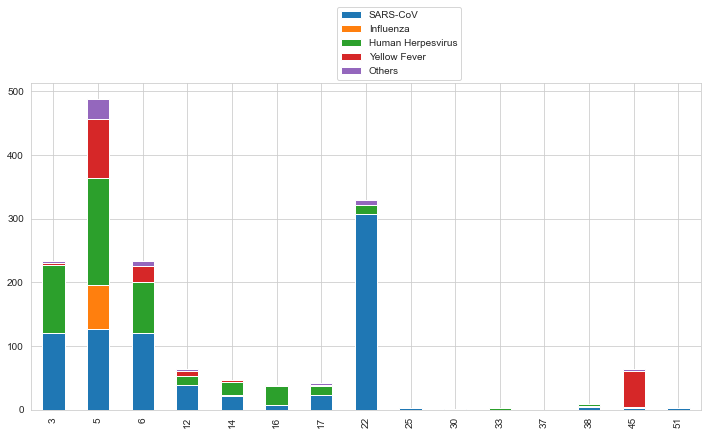

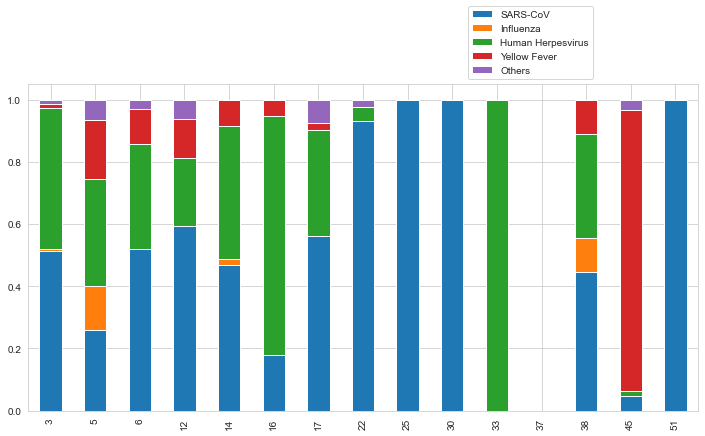

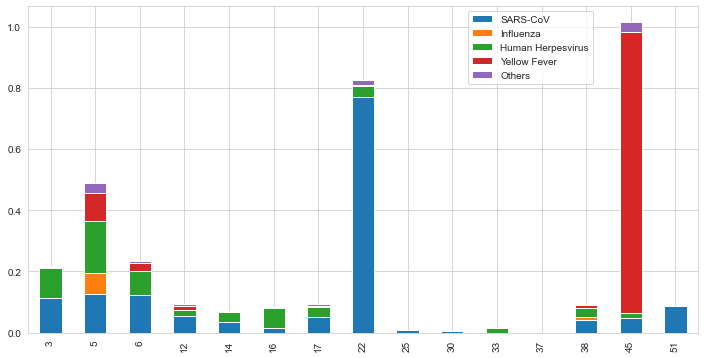

In [83]:
disease_norm, disease_count_ct = count_plots_disease(disease_by_leiden)

In [84]:
disease_norm[(disease_norm['SARS-CoV']>0.5)
            & (disease_count_ct['SARS-CoV']>0.1)]

,SARS-CoV,Influenza,Human Herpesvirus,Yellow Fever,Others
3,0.515021,0.004292,0.454936,0.012876,0.012876
6,0.519313,NaN,0.339056,0.111588,0.030043
22,0.933131,NaN,0.042553,0.003040,0.021277


In [85]:
disease_norm[(disease_norm[['Influenza', 'Human Herpesvirus', 'Yellow Fever', 'Others']].sum(axis=1)>0.5)
            & (disease_count_ct[['Influenza', 'Human Herpesvirus', 'Yellow Fever', 'Others']].sum(axis=1)>0.1)]

,SARS-CoV,Influenza,Human Herpesvirus,Yellow Fever,Others
5,0.260246,0.139344,0.346311,0.188525,0.065574
45,0.047619,NaN,0.015873,0.904762,0.031746


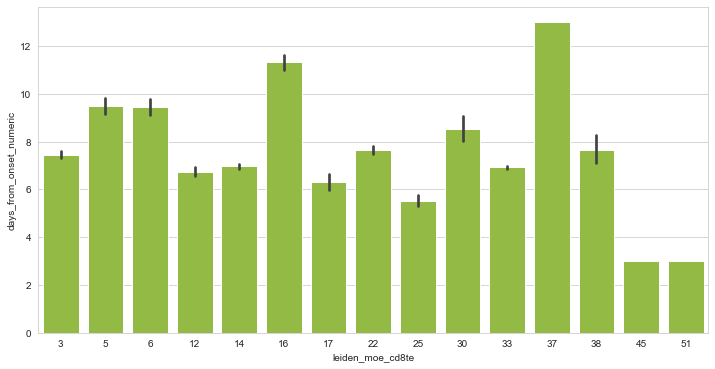

In [86]:
plot = sb.barplot(data=data[data.obs['leiden_moe_cd8te'].isin(react_leiden)].obs, x='leiden_moe_cd8te', y='days_from_onset_numeric', 
                     color='yellowgreen')

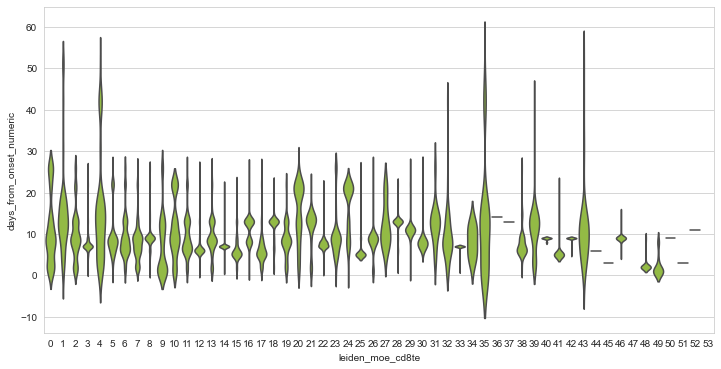

In [87]:
plot = sb.violinplot(data=data.obs, x='leiden_moe_cd8te', y='days_from_onset_numeric', 
                     color='yellowgreen', scale='width', inner=None)

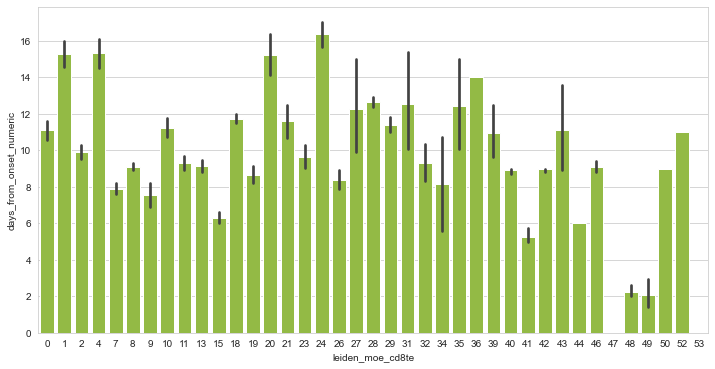

In [88]:
plot = sb.barplot(data=data[~data.obs['leiden_moe_cd8te'].isin(react_leiden)].obs, x='leiden_moe_cd8te', y='days_from_onset_numeric', 
                     color='yellowgreen')

In [89]:
filter_gene_prefixs = ['TRAV', 'TRAJ', 'TRAC', 'TRB', 'TRDV', 'TRDC', 'TRG']
non_tcr_genes = data.var_names

print(len(non_tcr_genes))
for prefix in filter_gene_prefixs:
    non_tcr_genes = [el for el in non_tcr_genes if not el.startswith(prefix)]
print(len(non_tcr_genes))

5000
4845


In [90]:
def get_significant_genes(bs_cluster, cv_clusters, vs_rest=False):
    def assign_cd8_status(c):
        if c in cv_clusters:
            return 'Covid'
        if c in bs_cluster:
            return 'Bystander'
        if vs_rest:
            return 'Rest'
        return np.nan
    data.obs['cd8te_assignment'] = data.obs['leiden_moe_cd8te'].apply(assign_cd8_status)
    data_test = data[~data.obs['cd8te_assignment'].isna()]
    data_test = data_test[:, non_tcr_genes].copy()

    sc.tl.rank_genes_groups(data_test, groupby='cd8te_assignment')
   
    idx_sig_by = data_test.uns['rank_genes_groups']['pvals_adj']['Bystander']<0.05  
    idx_by = np.logical_and(idx_sig_by, data_test.uns['rank_genes_groups']['logfoldchanges']['Bystander']>0.25)
    
    idx_sig_cv = data_test.uns['rank_genes_groups']['pvals_adj']['Covid']<0.05
    idx_cv = np.logical_and(idx_sig_cv, data_test.uns['rank_genes_groups']['logfoldchanges']['Covid']>0.25)
    
    genes_by = data_test.uns['rank_genes_groups']['names']['Bystander'][idx_by]
    genes_cv = data_test.uns['rank_genes_groups']['names']['Covid'][idx_cv]
    
    return genes_by.tolist(), genes_cv.tolist(), data_test

In [91]:
weak_cv = ['3', '6', '12', '17', '22', '25', '30', '51']
weak_bs = ['5', '14', '16', '33', '38', '45']

medium_cv = ['3', '6', '12', '17', '22', '51']
medium_bs = ['5', '16',  '45']

strong_cv = ['3', '6', '22']
strong_bs = ['5', '45']

In [92]:
weak_by_genes, weak_cv_genes, _ = get_significant_genes(weak_cv, weak_bs)

In [93]:
medium_by_genes, medium_cv_genes, data_selected = get_significant_genes(medium_cv, medium_bs)

In [94]:
strong_by_genes, strong_cv_genes, _ = get_significant_genes(strong_cv, strong_bs)

In [95]:
data_selected.uns['rank_genes_groups']

{'params': {'groupby': 'cd8te_assignment',
  'reference': 'rest',
  'method': 't-test',
  'use_raw': True,
  'layer': None,
  'corr_method': 'benjamini-hochberg'},
 'names': rec.array([('CD8A', 'IL7R'), ('CD8B', 'MT-CO1'), ('FCGR3A', 'KLRB1'), ...,
            ('KLRB1', 'FCGR3A'), ('MT-CO1', 'CD8B'), ('IL7R', 'CD8A')],
           dtype=[('Bystander', 'O'), ('Covid', 'O')]),
 'scores': rec.array([( 17.717047,  14.803314), ( 15.039758,  12.391533),
            ( 13.913212,  10.835088), ..., (-10.835088, -13.913212),
            (-12.391533, -15.039758), (-14.803314, -17.717047)],
           dtype=[('Bystander', '<f4'), ('Covid', '<f4')]),
 'pvals': rec.array([(2.79973948e-66, 1.59717146e-47),
            (2.07681939e-49, 1.51813134e-34),
            (6.17133580e-43, 1.17545050e-26), ...,
            (1.17545050e-26, 6.17133580e-43),
            (1.51813134e-34, 2.07681939e-49),
            (1.59717146e-47, 2.79973948e-66)],
           dtype=[('Bystander', '<f8'), ('Covid', '<f8')]),
 'pv

In [96]:
genes = data_selected.uns['rank_genes_groups']['names']['Bystander'].tolist()

lfc_by = data_selected.uns['rank_genes_groups']['logfoldchanges']['Bystander'].tolist()
pval_by = data_selected.uns['rank_genes_groups']['pvals']['Bystander'].tolist()
pvalAd_by = data_selected.uns['rank_genes_groups']['pvals_adj']['Bystander'].tolist()


df_genes = pd.DataFrame(data={'Gene': genes, 
                              'logfoldchange': lfc_by, 
                              'pvalue': pval_by, 
                              'pvalueAdjusted': pvalAd_by,
                             })
df_genes.to_csv('../results/supplement/S4_haniffa_degs.csv')

In [97]:
data.uns['rank_genes_groups'] = data_selected.uns['rank_genes_groups']

In [98]:
sc.write(adata=data, filename=path_out, compression='gzip')

In [99]:
data = sc.read(path_out)

# TcrDist3

In [100]:
from tcrdist.repertoire import TCRrep
from tcrdist.tree import TCRtree
from tqdm import tqdm

In [101]:
data_cd8te = data[data.obs['full_clustering']=='CD8.TE'].copy()
data_cd8te.obs['leiden_moe'] = latent_moe_cd8ef.obs['leiden']

In [102]:
df_cd8ef = data_cd8te.obs.copy()
df_cd8ef = df_cd8ef[['IR_VJ_1_v_call', 'IR_VJ_1_junction_aa', 
                     'IR_VDJ_1_v_call', 'IR_VDJ_1_junction_aa', 'clonotype']]
df_cd8ef = df_cd8ef.drop_duplicates(['IR_VJ_1_junction_aa', 'IR_VDJ_1_junction_aa'])
df_cd8ef = df_cd8ef.reset_index(drop=True)
df_cd8ef = df_cd8ef.rename(columns={
    'IR_VJ_1_v_call': 'v_a_gene',
    'IR_VJ_1_junction_aa': 'cdr3_a_aa',
    
    'IR_VDJ_1_v_call': 'v_b_gene',
    'IR_VDJ_1_junction_aa':  'cdr3_b_aa'
})

for col in df_cd8ef.columns:
    dtype = str
    if col == 'clonotype':
        dtype = int
    df_cd8ef[col] = df_cd8ef[col].astype(dtype)
    
df_cd8ef['v_a_gene'] = df_cd8ef['v_a_gene'] + '*01'
df_cd8ef['v_b_gene'] = df_cd8ef['v_b_gene'] + '*01'
df_cd8ef.head(5)

,v_a_gene,cdr3_a_aa,v_b_gene,cdr3_b_aa,clonotype
0,TRAV8-4*01,CAVSVVRNNNARLMF,TRBV5-1*01,CASSARGASGERTDTQYF,0
1,TRAV29/DV5*01,CAASARGGGSNYKLTF,TRBV3-1*01,CASRPGTGDTGELFF,34
2,TRAV19*01,CALNSNSGYALNF,TRBV6-6*01,CASKVGSGGGNTIYF,37
3,TRAV13-1*01,CAANDYKLSF,TRBV7-9*01,CASSPNSPGVNEQYF,84
4,TRAV1-2*01,CAVGSVGSARQLTF,TRBV7-2*01,CASSPRGQGGEPQHF,92


In [103]:
tr = TCRrep(cell_df=df_cd8ef, organism='human', chains=['alpha','beta'])
#dists = tr.pw_alpha + tr.pw_beta
dists = tr.pw_cdr3_a_aa + tr.pw_cdr3_b_aa

dists = np.triu(dists, k=1) # mask lower triangular + diagonal entries
dists[dists==0] = -99

columns = tr.clone_df['clonotype']
dists = pd.DataFrame(dists, columns=columns, index=columns)

100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.63it/s]


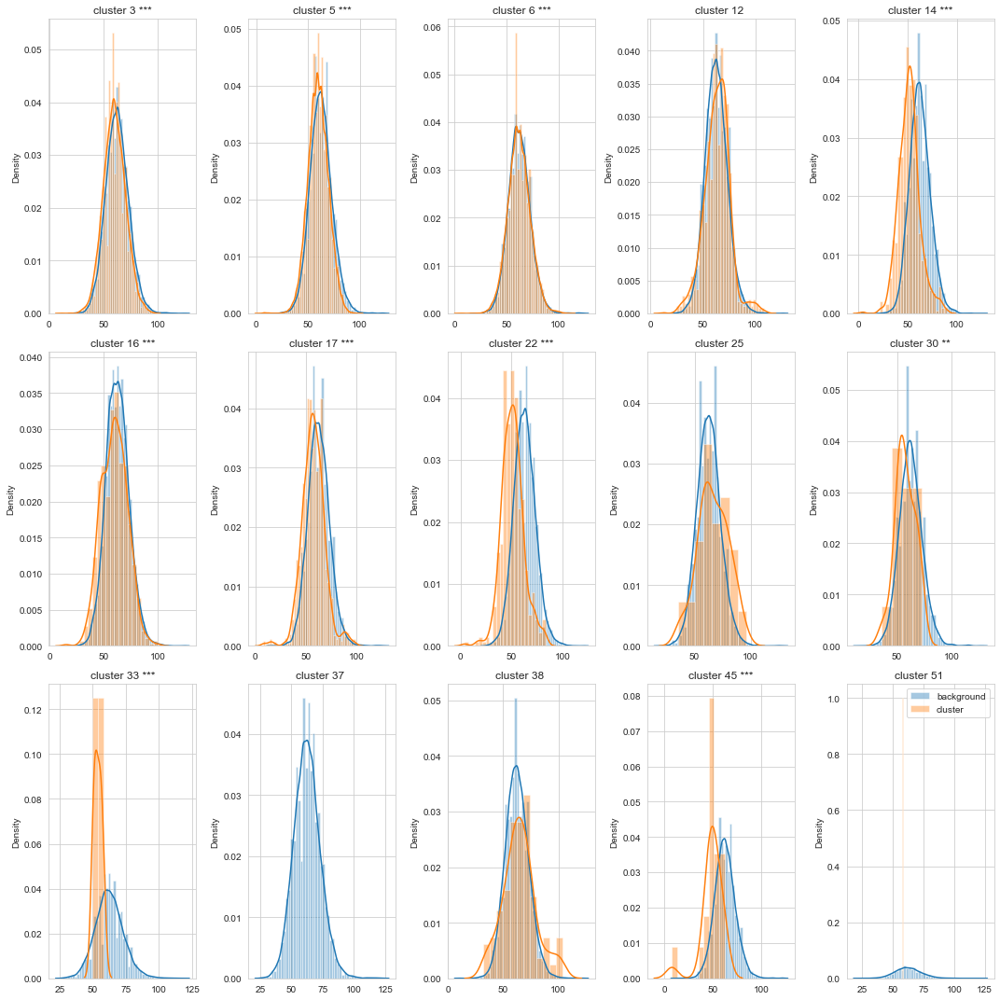

In [104]:
n_cols = 5
n_rows = 3
fig, axes = plt.subplots(ncols=n_cols, nrows=n_rows, figsize=(n_cols*3, n_cols*3))
axes = axes.reshape(-1)

p_values = {}
for i, cluster in enumerate(tqdm(react_leiden)):
    cts = data_cd8te[data_cd8te.obs['leiden_moe_cd8te']==cluster].obs['clonotype'].unique()
    dist_cluster = dists[cts]
    dist_cluster = dist_cluster.loc[cts].values
    dist_cluster = dist_cluster[dist_cluster!=-99]
    
    background = dists.values
    background = background[background!=-99]
    
    p = scipy.stats.ttest_ind(a=dist_cluster, b=background, equal_var=False, alternative='less')
    p_values[cluster] = p

    p = p[1]
    p_sign = map_pvalue_sign(p)
    
    
    background = np.random.choice(background, size=int(1e4), replace=False)
    sb.distplot(background, label='background', ax=axes[i])
    sb.distplot(dist_cluster, label=f'cluster', ax=axes[i])
    #axes[i].legend()
    axes[i].set_title(f'cluster {cluster} {p_sign}')
        
fig.tight_layout()
plt.legend()
plt.show()

In [105]:
tcr_dist_sig = [el for el, p in p_values.items() if p[1]<0.001]
len(tcr_dist_sig)

9

## Gene distance

In [106]:
from scipy import stats
from tqdm import tqdm

In [107]:
rs_squared = np.corrcoef(latent_moe_cd8ef.X)

In [108]:
rs_squared = np.triu(rs_squared, k=1)
rs_squared[rs_squared==0] = -99

100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.99s/it]


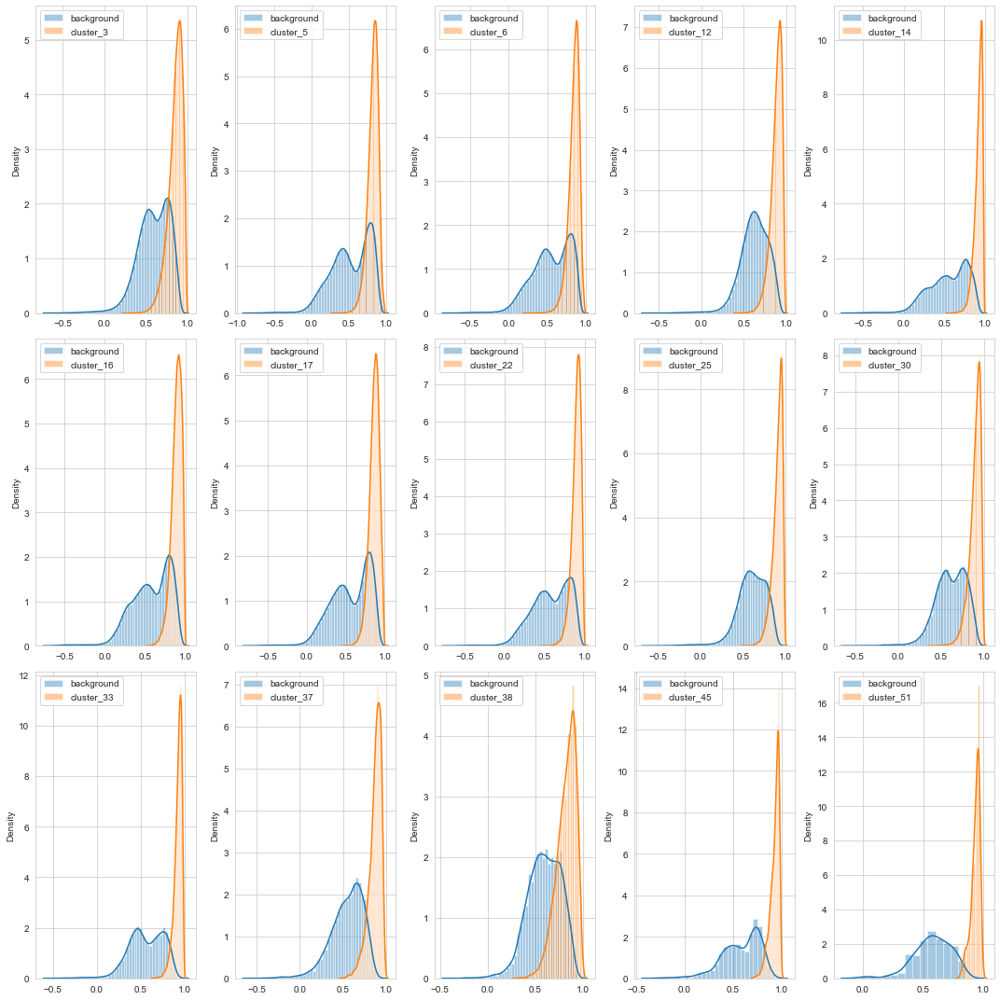

In [109]:
n_cols = 5
n_rows = 3
fig, axes = plt.subplots(ncols=n_cols, nrows=n_rows, figsize=(n_cols*3, n_cols*3))
axes = axes.reshape(-1)


for i, cluster in enumerate(tqdm(react_leiden)):
    mask_cluster = (data_cd8te.obs['leiden_moe_cd8te'] == cluster).values
    corr_cluster = rs_squared[mask_cluster][:, mask_cluster]
    corr_cluster = corr_cluster[corr_cluster!=-99]

    background = rs_squared[mask_cluster][:, np.invert(mask_cluster)]
    background = background[background!=-99]

    background = np.random.choice(background, size=corr_cluster.shape[0], replace=False)
    sb.distplot(background, label='background', ax=axes[i])
    sb.distplot(corr_cluster, label=f'cluster_{cluster}', ax=axes[i])
    axes[i].legend()
        
fig.tight_layout()
plt.show()

In [110]:
p_values = {}
for cluster in react_leiden:
    mask_cluster = (latent_moe_cd8ef.obs['leiden'] == cluster).values
    corr_cluster = rs_squared[mask_cluster][:, mask_cluster]
    corr_cluster = corr_cluster[corr_cluster!=-99]

    background = rs_squared[mask_cluster][:, np.invert(mask_cluster)]
    background = background[background!=-99]

    p = scipy.stats.ttest_ind(a=corr_cluster, b=background, equal_var=False, alternative='greater')
    p_values[cluster] = p
p_values

{'3': Ttest_indResult(statistic=2055.970631088027, pvalue=0.0),
 '5': Ttest_indResult(statistic=2411.3302608696663, pvalue=0.0),
 '6': Ttest_indResult(statistic=2407.5350907241623, pvalue=0.0),
 '12': Ttest_indResult(statistic=1803.435145203301, pvalue=0.0),
 '14': Ttest_indResult(statistic=2452.2426384620853, pvalue=0.0),
 '16': Ttest_indResult(statistic=1373.6895398590761, pvalue=0.0),
 '17': Ttest_indResult(statistic=1339.7363937983914, pvalue=0.0),
 '22': Ttest_indResult(statistic=1425.0748382870834, pvalue=0.0),
 '25': Ttest_indResult(statistic=1045.5680392144266, pvalue=0.0),
 '30': Ttest_indResult(statistic=551.7107413679751, pvalue=0.0),
 '33': Ttest_indResult(statistic=740.6016319799613, pvalue=0.0),
 '37': Ttest_indResult(statistic=318.4518552915995, pvalue=0.0),
 '38': Ttest_indResult(statistic=162.07481613614533, pvalue=0.0),
 '45': Ttest_indResult(statistic=264.18937518285014, pvalue=0.0),
 '51': Ttest_indResult(statistic=149.87675190570937, pvalue=0.0)}